In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
ins_data = pd.read_csv('https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Insurance%20Claim%20Fraud%20Detection/Automobile_insurance_fraud.csv')
ins_data

,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES.1,71610,6510,13020,52080,Saab,92x,2004,Y
0,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
1,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
2,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
3,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
4,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,...,2,NO,64100,6410,6410,51280,Saab,95,2003,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
995,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
996,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
997,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [3]:
ins_data.shape

(999, 39)

*There are 999 rows and 39 columns in our dataset.*

In [4]:
ins_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 39 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   328                       999 non-null    int64  
 1   48                        999 non-null    int64  
 2   521585                    999 non-null    int64  
 3   17-10-2014                999 non-null    object 
 4   OH                        999 non-null    object 
 5   250/500                   999 non-null    object 
 6   1000                      999 non-null    int64  
 7   1406.91                   999 non-null    float64
 8   0                         999 non-null    int64  
 9   466132                    999 non-null    int64  
 10  MALE                      999 non-null    object 
 11  MD                        999 non-null    object 
 12  craft-repair              999 non-null    object 
 13  sleeping                  999 non-null    object 
 14  husband   

In [5]:
columns = ins_data.columns
print(columns)

Index(['328', '48', '521585', '17-10-2014', 'OH', '250/500', '1000', '1406.91',
       '0', '466132', 'MALE', 'MD', 'craft-repair', 'sleeping', 'husband',
       '53300', '0.1', '25-01-2015', 'Single Vehicle Collision',
       'Side Collision', 'Major Damage', 'Police', 'SC', 'Columbus',
       '9935 4th Drive', '5', '1', 'YES', '1.1', '2', 'YES.1', '71610', '6510',
       '13020', '52080', 'Saab', '92x', '2004', 'Y'],
      dtype='object')


In [6]:
# Create a dictionary mapping old column names to new descriptive names
column_mapping = {
    '328': 'months_as_customer',
    '48': 'age',
    '521585': 'policy_number',
    '17-10-2014': 'policy_bind_date',
    'OH': 'policy_state',
    '250/500': 'policy_csl',
    '1000': 'policy_deductible',
    '1406.91': 'policy_annual_premium',
    '0': 'umbrella_limit',
    '466132': 'insured_zip',
    'MALE': 'insured_sex',
    'MD': 'insured_education_level',
    'craft-repair': 'insured_occupation',
    'sleeping': 'insured_hobbies',
    'husband': 'insured_relationship',
    '53300': 'capital-gains',
    '0.1': 'capital-loss',
    '25-01-2015': 'incident_date',
    'Single Vehicle Collision': 'incident_type',
    'Side Collision': 'collision_type',
    'Major Damage': 'incident_severity',
    'Police': 'authorities_contacted',
    'SC': 'incident_state',
    'Columbus': 'incident_city',
    '9935 4th Drive': 'incident_location',
    '5': 'incident_hour_of_the_day',
    '1': 'number_of_vehicles_involved',
    'YES': 'property_damage',
    '1.1': 'bodily_injuries',
    '2': 'witnesses',
    'YES.1': 'police_report_available',
    '71610': 'total_claim_amount',
    '6510': 'injury_claim',
    '13020': 'property_claim',
    '52080': 'vehicle_claim',
    'Saab': 'auto_make',
    '92x': 'auto_model',
    '2004': 'auto_year',
    'Y': 'fraud_reported'
}

# Step 1: Add the current column names as the first row of the DataFrame
ins_data.loc[-1] = ins_data.columns
ins_data.index = ins_data.index + 1  # Shift the index
ins_data = ins_data.sort_index()  # Sort the DataFrame to put the new row at the top

# Step 2: Rename the columns using the column_mapping dictionary
ins_data.rename(columns=column_mapping, inplace=True)

# Display the updated DataFrame
print(ins_data.head())


  months_as_customer age policy_number policy_bind_date policy_state  \
0                328  48        521585       17-10-2014           OH   
1                228  42        342868       27-06-2006           IN   
2                134  29        687698       06-09-2000           OH   
3                256  41        227811       25-05-1990           IL   
4                228  44        367455       06-06-2014           IL   

  policy_csl policy_deductible policy_annual_premium umbrella_limit  \
0    250/500              1000               1406.91              0   
1    250/500              2000               1197.22        5000000   
2    100/300              2000               1413.14        5000000   
3    250/500              2000               1415.74        6000000   
4   500/1000              1000               1583.91        6000000   

  insured_zip  ... witnesses police_report_available total_claim_amount  \
0      466132  ...         2                   YES.1             

In [ ]:
# ins_data.loc[-1] = ins_data.columns
# ins_data.index = ins_data.index + 1  # shifting index
# ins_data = ins_data.sort_index()

# # Step 2: Replace the column names with new names
# new_column_names = [f'Column_{i}' for i in range(1, len(ins_data.columns) + 1)]
# ins_data.columns = new_column_names

# print(ins_data)


    Column_1 Column_2 Column_3    Column_4 Column_5  Column_6 Column_7  \
0        328       48   521585  17-10-2014       OH   250/500     1000   
1        228       42   342868  27-06-2006       IN   250/500     2000   
2        134       29   687698  06-09-2000       OH   100/300     2000   
3        256       41   227811  25-05-1990       IL   250/500     2000   
4        228       44   367455  06-06-2014       IL  500/1000     1000   
..       ...      ...      ...         ...      ...       ...      ...   
995        3       38   941851  16-07-1991       OH  500/1000     1000   
996      285       41   186934  05-01-2014       IL   100/300     1000   
997      130       34   918516  17-02-2003       OH   250/500      500   
998      458       62   533940  18-11-2011       IL  500/1000     2000   
999      456       60   556080  11-11-1996       OH   250/500     1000   

    Column_8 Column_9 Column_10  ... Column_30 Column_31 Column_32 Column_33  \
0    1406.91        0    466132

In [7]:
ins_data.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductible',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')

In [8]:
ins_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   months_as_customer           1000 non-null   object
 1   age                          1000 non-null   object
 2   policy_number                1000 non-null   object
 3   policy_bind_date             1000 non-null   object
 4   policy_state                 1000 non-null   object
 5   policy_csl                   1000 non-null   object
 6   policy_deductible            1000 non-null   object
 7   policy_annual_premium        1000 non-null   object
 8   umbrella_limit               1000 non-null   object
 9   insured_zip                  1000 non-null   object
 10  insured_sex                  1000 non-null   object
 11  insured_education_level      1000 non-null   object
 12  insured_occupation           1000 non-null   object
 13  insured_hobbies              1000 non-n

In [9]:
ins_data.columns.to_list()

['months_as_customer',
 'age',
 'policy_number',
 'policy_bind_date',
 'policy_state',
 'policy_csl',
 'policy_deductible',
 'policy_annual_premium',
 'umbrella_limit',
 'insured_zip',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'capital-gains',
 'capital-loss',
 'incident_date',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'incident_location',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'property_damage',
 'bodily_injuries',
 'witnesses',
 'police_report_available',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_make',
 'auto_model',
 'auto_year',
 'fraud_reported']

In [10]:
ins_data.isnull().sum()

months_as_customer              0
age                             0
policy_number                   0
policy_bind_date                0
policy_state                    0
policy_csl                      0
policy_deductible               0
policy_annual_premium           0
umbrella_limit                  0
insured_zip                     0
insured_sex                     0
insured_education_level         0
insured_occupation              0
insured_hobbies                 0
insured_relationship            0
capital-gains                   0
capital-loss                    0
incident_date                   0
incident_type                   0
collision_type                  0
incident_severity               0
authorities_contacted          91
incident_state                  0
incident_city                   0
incident_location               0
incident_hour_of_the_day        0
number_of_vehicles_involved     0
property_damage                 0
bodily_injuries                 0
witnesses     

In [11]:
ins_data.fillna(ins_data['authorities_contacted'].mode()[0] , inplace = True)

In [12]:
ins_data.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductible              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

*Here , We can see that there is no null values present in our Dataset.*

# **DATA PRE-PROCESSING**

In [13]:
# Dropping those columns , which is not in use.

ins_data.drop(columns = ['policy_number' , 'incident_location'] , axis = 1 , inplace = True)

In [14]:
ins_data.shape

(1000, 37)

In [15]:
for i in ins_data.columns :
  print(ins_data[i].value_counts())
  print("\n")

months_as_customer
194    8
128    7
210    7
140    7
285    7
      ..
467    1
414    1
352    1
347    1
17     1
Name: count, Length: 392, dtype: int64


age
43    49
39    48
41    45
34    44
30    42
38    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
36    32
42    32
44    32
35    32
28    30
45    26
26    26
27    24
48    24
47    24
57    16
55    14
25    14
49    14
50    13
53    13
61    10
54    10
24    10
60     9
51     9
56     8
58     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
20     1
48     1
19     1
22     1
Name: count, dtype: int64


policy_bind_date
01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: count, Length: 951, dtype: int64


policy_state
OH    352
IL    338
IN    310
Name: count, dtype: int64


policy_csl
250/500     351
100/300     349
500/1000    300
Name: count, dtype: in

From the values we can observe,
*
1. The features collision_type, police_report_available, property_damage have ? as values.
2. The features umbrella_limit has a about 80% of it's values as 0, so we can drop it.
3. The feature insured_zip, is a list of unique numbers, so let us drop it.*

In [16]:
ins_data.drop(['umbrella_limit' , 'insured_zip'] , axis = 1 , inplace = True)

*Let us retrieve the day, month and year from the features policy_bind_day and incident_date*

In [17]:
ins_data['policy_bind_date']=pd.to_datetime(ins_data['policy_bind_date'])
ins_data['incident_date']=pd.to_datetime(ins_data['incident_date'])

<ipython-input-17-85a852d81472>:1: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  ins_data['policy_bind_date']=pd.to_datetime(ins_data['policy_bind_date'])
<ipython-input-17-85a852d81472>:2: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  ins_data['incident_date']=pd.to_datetime(ins_data['incident_date'])


In [18]:
# Extracting Day, Month and Year column from policy_bind_date
ins_data['policy_bind_day'] = ins_data['policy_bind_date'].dt.day
ins_data['policy_bind_month'] = ins_data['policy_bind_date'].dt.month
ins_data['policy_bind_year'] = ins_data['policy_bind_date'].dt.year

# Extracting Day, Month and Year column from incident_date
ins_data['incident_day'] = ins_data['incident_date'].dt.day
ins_data['incident_month'] = ins_data['incident_date'].dt.month
ins_data['incident_year'] = ins_data['incident_date'].dt.year

In [19]:
ins_data.drop(['policy_bind_date','incident_date'],axis=1,inplace=True)

#### To find where the ? data is present throughout the dataset

In [20]:
ins_data[ins_data.columns[(ins_data=="?").any()]].nunique()

collision_type             4
property_damage            3
police_report_available    4
dtype: int64

*All these columns are categorical columns, so let us fill theose values with it's mode.*

In [21]:
ins_data['collision_type'].value_counts()

collision_type
Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: count, dtype: int64

In [22]:
ins_data['collision_type'] = ins_data.collision_type.str.replace('?' , ins_data['collision_type'].mode()[0])

In [23]:
ins_data['property_damage'].value_counts()

property_damage
?      360
NO     338
YES    302
Name: count, dtype: int64

We will fill the "?" in the feature property_damage with the value "NO"

In [24]:
ins_data['property_damage'] = ins_data.property_damage.str.replace('?' , 'NO')

In [25]:
ins_data['police_report_available'].value_counts()

police_report_available
?        343
NO       343
YES      313
YES.1      1
Name: count, dtype: int64

*Let us fill the unknown value with NO*

In [26]:
ins_data['police_report_available'] = ins_data.police_report_available.str.replace('?' , "NO")

*The features policy_csl showing object data type but it contains numerical data,let us extratc csl_per_person and csl_per_accident from policy_csl column and then will convert their object data type into integer data type.*

In [27]:
# Extracting csl_per_person and cls_per_accident from policy_csl column.

ins_data['csl_per_person'] = ins_data.policy_csl.str.split('/' , expand=True)[0]
ins_data['csl_per_accident'] = ins_data.policy_csl.str.split('/' , expand = True)[1]

In [28]:
# Converting object datatype into integer data type
ins_data['csl_per_person']=ins_data['csl_per_person'].astype('int64')
ins_data['csl_per_accident']=ins_data['csl_per_accident'].astype('int64')

In [29]:
# since we ectracted the data from policy_csl column , So let's rop it.

ins_data.drop('policy_csl' , axis = 1 , inplace = True)

In [30]:
ins_data['auto_year'] = ins_data['auto_year'].astype('int64')

In [31]:
# Lets extract age of the vehicle from auto_year by subtracting it from the year 2018
ins_data['Vehicle_Age']=2021-ins_data['auto_year']
ins_data.drop("auto_year",axis=1,inplace=True)

In [32]:
# checking for unique value present in dataset

ins_data.nunique().to_frame("Number of unique values")

,Number of unique values
months_as_customer,392
age,47
policy_state,3
policy_deductible,4
policy_annual_premium,991
insured_sex,2
insured_education_level,7
insured_occupation,14
insured_hobbies,20
insured_relationship,6


*The column incident_year has only 1 value ,  So we can drop that column.*

In [33]:
# Dropping incident_year column

ins_data.drop('incident_year' , axis = 1 , inplace = True)

In [34]:
ins_data.head()

,months_as_customer,age,policy_state,policy_deductible,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,...,auto_model,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
0,328,48,OH,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,...,92x,Y,17,10,2014,25,1,250,500,17
1,228,42,IN,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,...,E400,Y,27,6,2006,21,1,250,500,14
2,134,29,OH,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,...,RAM,N,6,9,2000,22,2,100,300,14
3,256,41,IL,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,...,Tahoe,Y,25,5,1990,10,1,250,500,7
4,228,44,IL,1000,1583.91,MALE,Associate,sales,board-games,unmarried,...,RSX,N,6,6,2014,17,2,500,1000,12


In [35]:
ins_data.shape

(1000, 39)

In [36]:
ins_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   months_as_customer           1000 non-null   object
 1   age                          1000 non-null   object
 2   policy_state                 1000 non-null   object
 3   policy_deductible            1000 non-null   object
 4   policy_annual_premium        1000 non-null   object
 5   insured_sex                  1000 non-null   object
 6   insured_education_level      1000 non-null   object
 7   insured_occupation           1000 non-null   object
 8   insured_hobbies              1000 non-null   object
 9   insured_relationship         1000 non-null   object
 10  capital-gains                1000 non-null   object
 11  capital-loss                 1000 non-null   object
 12  incident_type                1000 non-null   object
 13  collision_type               1000 non-n

*Seperating the categorical and numerical column.*

In [37]:
ins_data['months_as_customer'] = ins_data['months_as_customer'].astype('int64')

In [38]:
ins_data['age'] = ins_data['age'].astype("int64")
ins_data['policy_deductible'] = ins_data['policy_deductible'].astype("int64")
ins_data['capital-gains'] = ins_data['capital-gains'].astype('int64')
ins_data['number_of_vehicles_involved'] = ins_data['number_of_vehicles_involved'].astype('int64')
ins_data['incident_hour_of_the_day'] = ins_data['incident_hour_of_the_day'].astype("int64")
ins_data['witnesses'] = ins_data['witnesses'].astype("int64")
ins_data['injury_claim'] = ins_data['injury_claim'].astype('int64')
ins_data['property_claim'] = ins_data['property_claim'].astype('int64')
ins_data['vehicle_claim'] = ins_data['vehicle_claim'].astype('int64')
ins_data['policy_bind_day'] = ins_data['policy_bind_day'].astype('int64')
ins_data['policy_bind_month'] = ins_data['policy_bind_month'].astype('int64')
ins_data['policy_bind_year'] = ins_data['policy_bind_year'].astype('int64')
ins_data['incident_month'] = ins_data['incident_month'].astype('int64')
ins_data['Vehicle_Age'] = ins_data['Vehicle_Age'].astype('int64')

In [39]:
# Convert the 'bodily_injuries' column to integers, ignoring any non-integer values

ins_data['total_claim_amount'] = ins_data['total_claim_amount'].astype('int64')
ins_data['bodily_injuries'] = ins_data['bodily_injuries'].astype('int64', errors='ignore') # Convert to int, ignoring errors
ins_data['capital-loss'] = ins_data['capital-loss'].astype("int64" , errors='ignore')

In [40]:
ins_data.info('policy_annual_premium')

<class 'pandas.core.frame.DataFrame'>
Index: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   months_as_customer           1000 non-null   int64 
 1   age                          1000 non-null   int64 
 2   policy_state                 1000 non-null   object
 3   policy_deductible            1000 non-null   int64 
 4   policy_annual_premium        1000 non-null   object
 5   insured_sex                  1000 non-null   object
 6   insured_education_level      1000 non-null   object
 7   insured_occupation           1000 non-null   object
 8   insured_hobbies              1000 non-null   object
 9   insured_relationship         1000 non-null   object
 10  capital-gains                1000 non-null   int64 
 11  capital-loss                 1000 non-null   object
 12  incident_type                1000 non-null   object
 13  collision_type               1000 non-n

In [42]:
ins_data['policy_annual_premium'] = ins_data['policy_annual_premium'].astype("int64" , errors = 'ignore')

In [43]:
# Checking for categorical columns :
cat_col = []
for col in ins_data.dtypes.index :
  if ins_data.dtypes[col] == 'object' :
    cat_col.append(col)
print("Categorical columns are : \n" , cat_col)
print("\n")

# Checking for numerical columns
numerical_col = []
for i in ins_data.dtypes.index:
    if ins_data.dtypes[i]!='object':
        numerical_col.append(i)
print("Numerical columns are:\n",numerical_col)
print("\n")


Categorical columns are : 
 ['policy_state', 'policy_annual_premium', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'capital-loss', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'bodily_injuries', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


Numerical columns are:
 ['months_as_customer', 'age', 'policy_deductible', 'capital-gains', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'policy_bind_day', 'policy_bind_month', 'policy_bind_year', 'incident_day', 'incident_month', 'csl_per_person', 'csl_per_accident', 'Vehicle_Age']




In [44]:
# checking for unique values in target columns :
ins_data['fraud_reported'].unique()



array(['Y', 'N'], dtype=object)

In [45]:
# Checking the list counts of target

ins_data['fraud_reported'].value_counts()

fraud_reported
N    753
Y    247
Name: count, dtype: int64

*As we can see that our dataset is imbalanced , so we need to balance it. We will use oversampling and balance the data later.*

In [46]:
ins_data.describe()

,months_as_customer,age,policy_deductible,capital-gains,incident_hour_of_the_day,number_of_vehicles_involved,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,25126.100000,11.644000,1.83900,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,15.448000,6.559000,2001.604000,14.995000,1.496000,272.650000,580.200000,15.897000
std,115.113174,9.140287,611.864673,27872.187708,6.951373,1.01888,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,8.808001,3.499824,7.360391,8.670995,0.523697,161.603196,287.420547,6.015861
min,0.000000,19.000000,500.000000,0.000000,0.000000,1.00000,0.000000,100.00000,0.000000,0.000000,70.000000,1.000000,1.000000,1990.000000,1.000000,1.000000,100.000000,300.000000,6.000000
25%,115.750000,32.000000,500.000000,0.000000,6.000000,1.00000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,8.000000,3.000000,1995.000000,7.750000,1.000000,100.000000,300.000000,11.000000
50%,199.500000,38.000000,1000.000000,0.000000,12.000000,1.00000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,16.000000,7.000000,2002.000000,15.000000,1.000000,250.000000,500.000000,16.000000
75%,276.250000,44.000000,2000.000000,51025.000000,17.000000,3.00000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,23.000000,10.000000,2008.000000,22.000000,2.000000,500.000000,1000.000000,21.000000
max,479.000000,64.000000,2000.000000,100500.000000,23.000000,4.00000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,31.000000,12.000000,2015.000000,31.000000,3.000000,500.000000,1000.000000,26.000000


# **EDA : EXPLORATORY DATA ANALYSIS**

# ***Uni-Variate Analysis***

fraud_reported
N    753
Y    247
Name: count, dtype: int64


<ipython-input-47-61ed9e3952b8>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = ins_data['fraud_reported'] , palette = 'Set3')


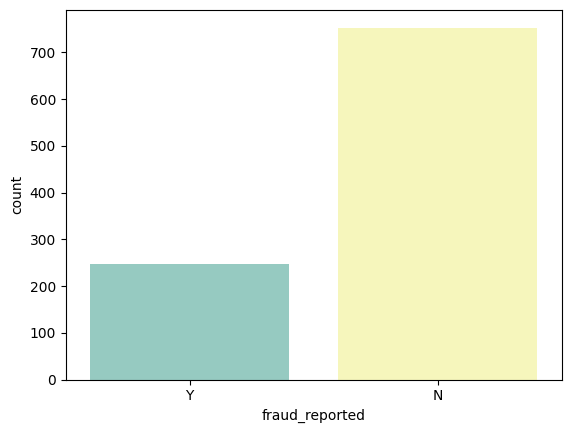

In [47]:
# Visualizing how many insurance claims is fraudulent.

print(ins_data['fraud_reported'].value_counts())
sns.countplot(x = ins_data['fraud_reported'] , palette = 'Set3')
plt.show()

policy_state
OH    352
IL    338
IN    310
Name: count, dtype: int64


<ipython-input-48-110852217e78>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = ins_data['policy_state'] , palette = 'PuRd')


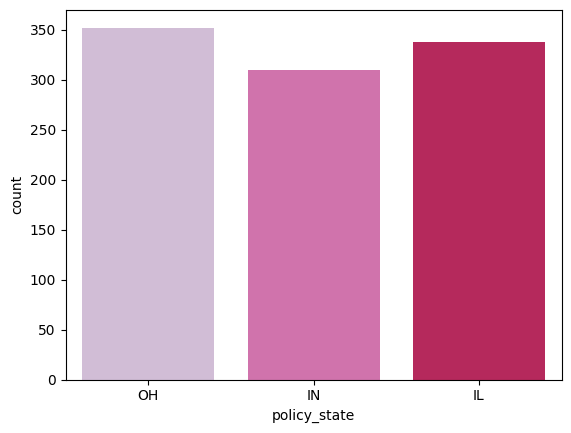

In [48]:
# Visualizing how many policy states are present in the dataset.

print(ins_data['policy_state'].value_counts())
sns.countplot(x = ins_data['policy_state'] , palette = 'PuRd')
plt.show()

insured_education_level
JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: count, dtype: int64


<ipython-input-49-2cff38011a92>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = ins_data['insured_education_level'],palette='PuRd')


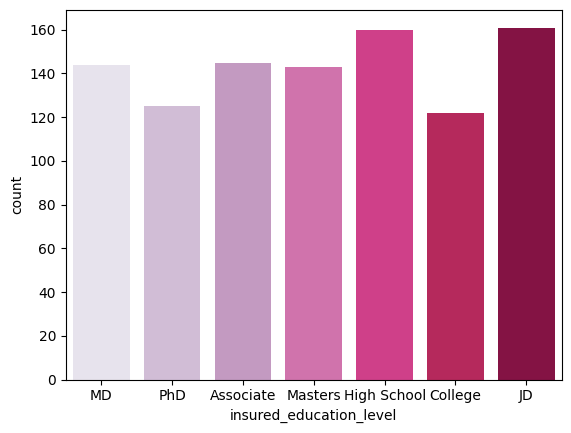

In [49]:
# Visualizing count of customers insured education level are present in the dataset
print(ins_data['insured_education_level'].value_counts())
sns.countplot(x = ins_data['insured_education_level'],palette='PuRd')
plt.show()

insured_occupation
machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: count, dtype: int64


<ipython-input-50-d2c2f57722ab>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = ins_data['insured_occupation'],palette='RdBu')


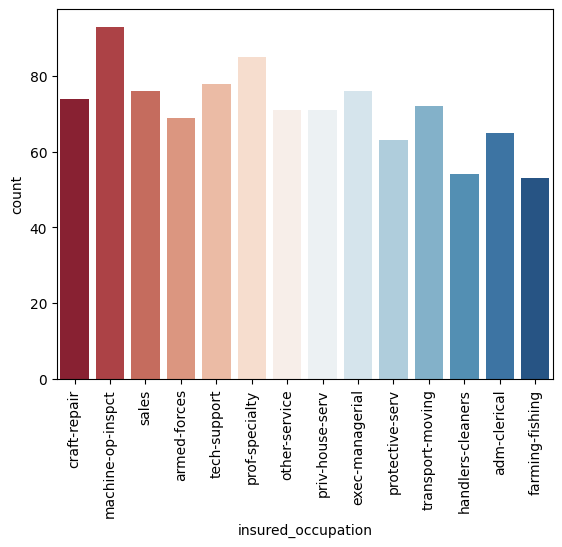

In [50]:
# Visualizing count of customers insured occupation are present in the dataset
print(ins_data['insured_occupation'].value_counts())
sns.countplot(x = ins_data['insured_occupation'],palette='RdBu')
plt.xticks(rotation=90)
plt.show()

insured_hobbies
reading           64
exercise          57
paintball         57
bungie-jumping    56
movies            55
golf              55
camping           55
kayaking          54
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: count, dtype: int64


<ipython-input-51-b8c66a2fd3d0>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = ins_data['insured_hobbies'],palette='PuBu')


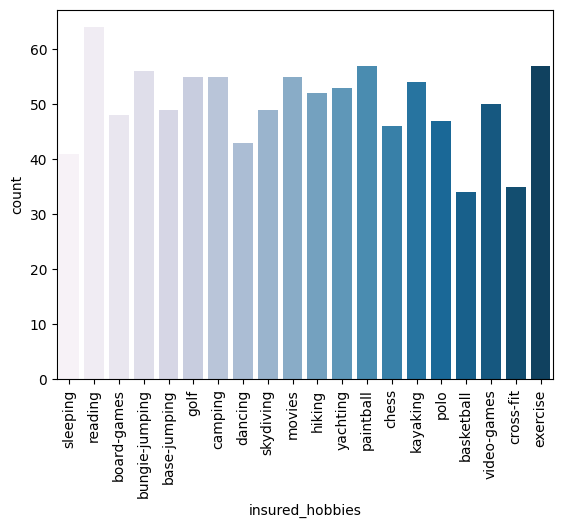

In [51]:
# Visualizing count of insured sex are present in the dataset
print(ins_data['insured_hobbies'].value_counts())
sns.countplot(x = ins_data['insured_hobbies'],palette='PuBu')
plt.xticks(rotation =90)
plt.show()

insured_relationship
own-child         183
other-relative    177
not-in-family     174
husband           170
wife              155
unmarried         141
Name: count, dtype: int64


<ipython-input-52-9bfd221db3fb>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = ins_data['insured_relationship'],palette='PRGn')


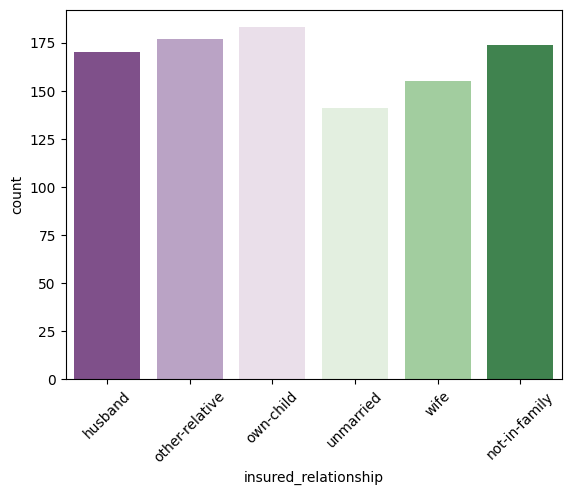

In [52]:
# Visualizing count of what kind of relationship the isured cutomers are in the dataset
print(ins_data['insured_relationship'].value_counts())
sns.countplot(x = ins_data['insured_relationship'],palette='PRGn')
plt.xticks(rotation = 45)
plt.show()

incident_type
Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: count, dtype: int64


<ipython-input-53-aed4044a4c24>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = ins_data['incident_type'],palette='Spectral')


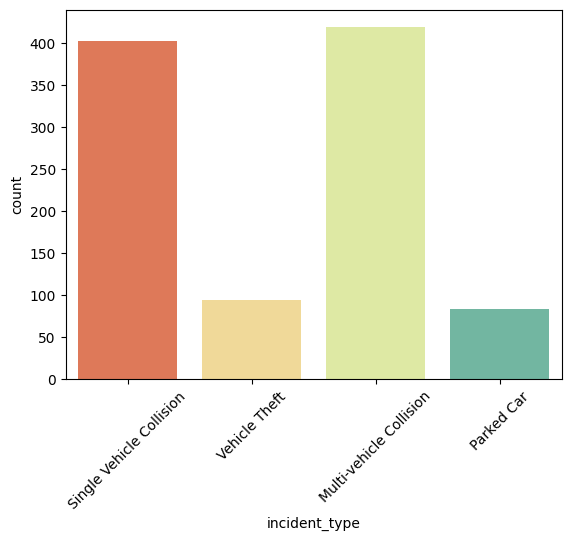

In [53]:
# Visualizing count of insured sex are present in the dataset
print(ins_data['incident_type'].value_counts())
sns.countplot(x = ins_data['incident_type'],palette='Spectral')
plt.xticks(rotation = 45)
plt.show()

collision_type
Rear Collision     470
Side Collision     276
Front Collision    254
Name: count, dtype: int64


<ipython-input-54-732d5b267353>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = ins_data['collision_type'],palette='OrRd')


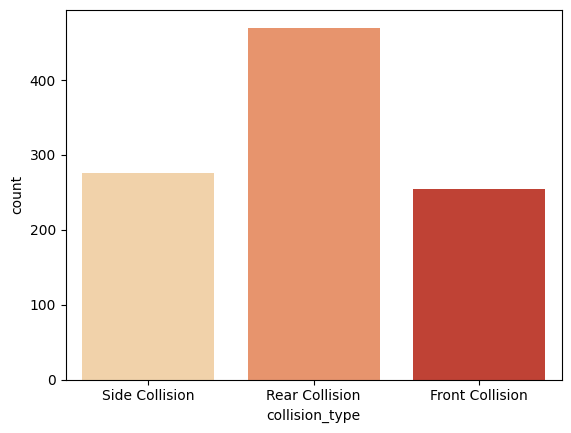

In [54]:
# Visualizing count of insured sex are present in the dataset
print(ins_data['collision_type'].value_counts())
sns.countplot(x = ins_data['collision_type'],palette='OrRd')
plt.show()

# *Checking for the distribution of Skewness.*

<ipython-input-55-f5ea0f468172>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(ins_data[col] , hist=False)
<ipython-input-55-f5ea0f468172>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(ins_data[col] , hist=False)
<ipython-input-55-f5ea0f468172>:6: UserWarning: 

`distplot`

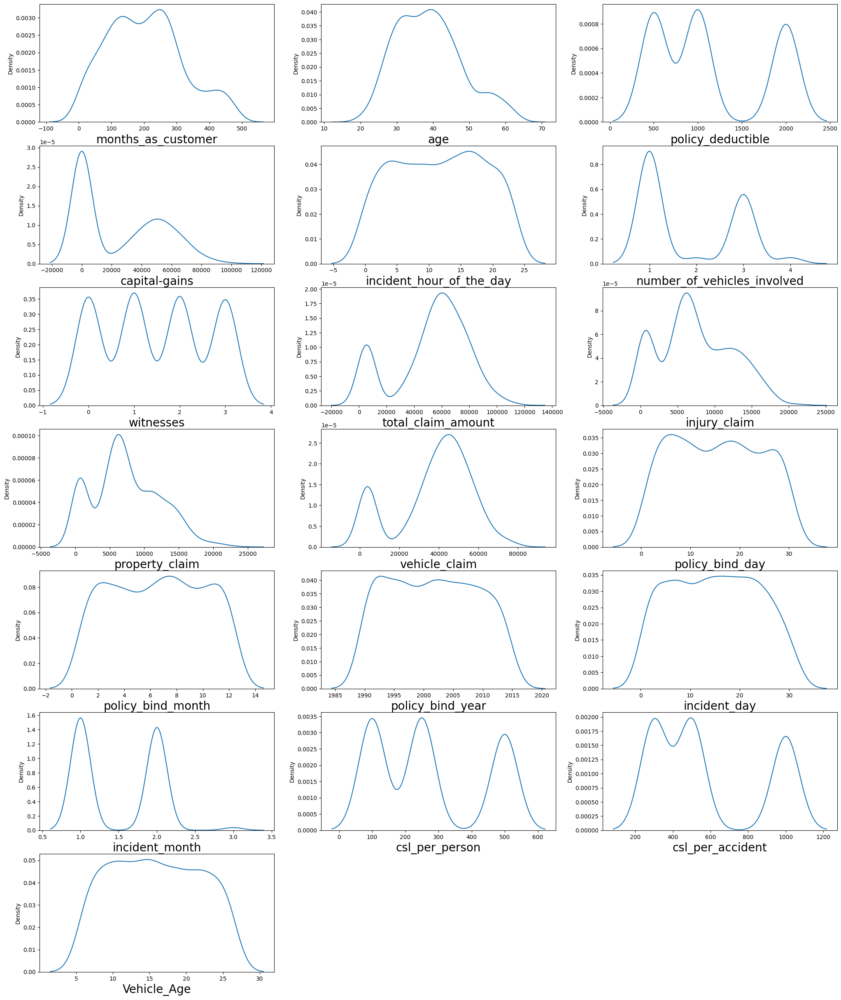

In [55]:
plt.figure(figsize = (25 , 35) , facecolor = 'white')
plotnumber = 1
for col in numerical_col :
  if plotnumber<=23 :
    ax = plt.subplot(8,3,plotnumber)
    sns.distplot(ins_data[col] , hist=False)
    plt.xlabel(col , fontsize = 20)
  plotnumber+=1
plt.show()

From the above distribution plots:
1. Most of the features are normally distributed.
2. The feature capital_gains is right skewed.
3. The feature capital_loss is left skewed.

# ***Bi-Variate Analysis***

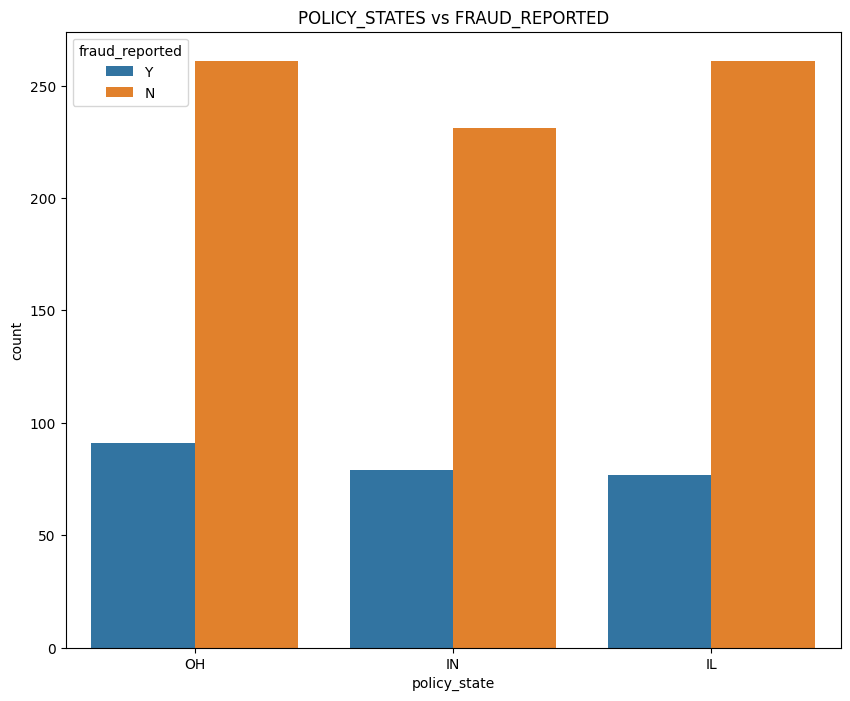

In [56]:
# Comparing poicy_state and fraud_reported

plt.figure(figsize = (10 , 8))
sns.countplot(x = ins_data['policy_state'] , data = ins_data , hue = 'fraud_reported')
plt.title("POLICY_STATES vs FRAUD_REPORTED")
plt.show()

*Here we can see that Fraud report is the highest in "OH".*

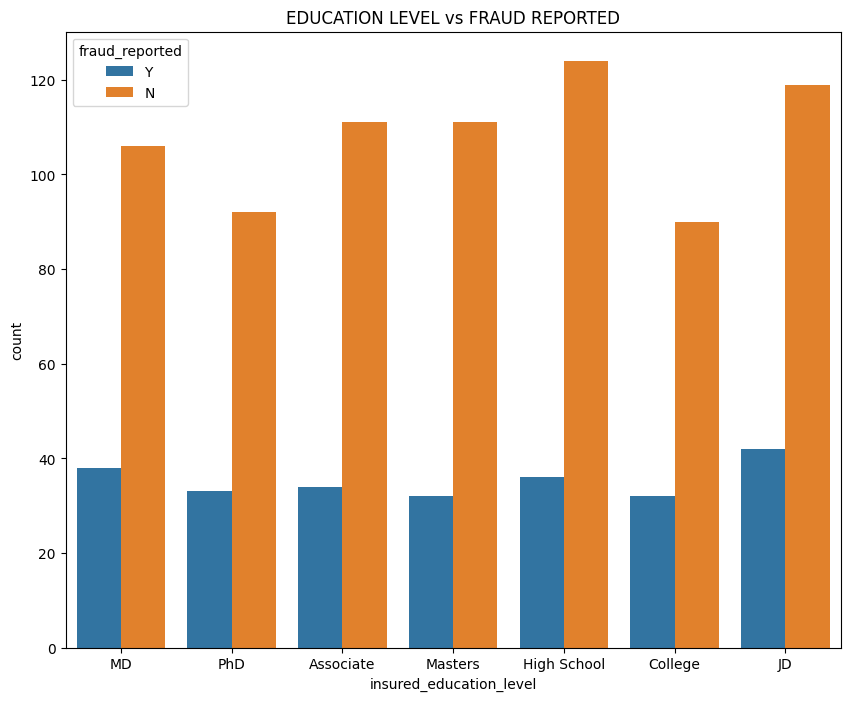

In [57]:
# Comparing insured_education_level and fraud_reported.

plt.figure(figsize = (10 , 8))
sns.countplot(x = ins_data['insured_education_level'] , data = ins_data , hue = ins_data['fraud_reported'])
plt.title("EDUCATION LEVEL vs FRAUD REPORTED")
plt.show()

* The fraud is commited mostly by the people who have completed their JD/MD level of education.
The fraudulent level is very less for the people who have completed their high scool education. *

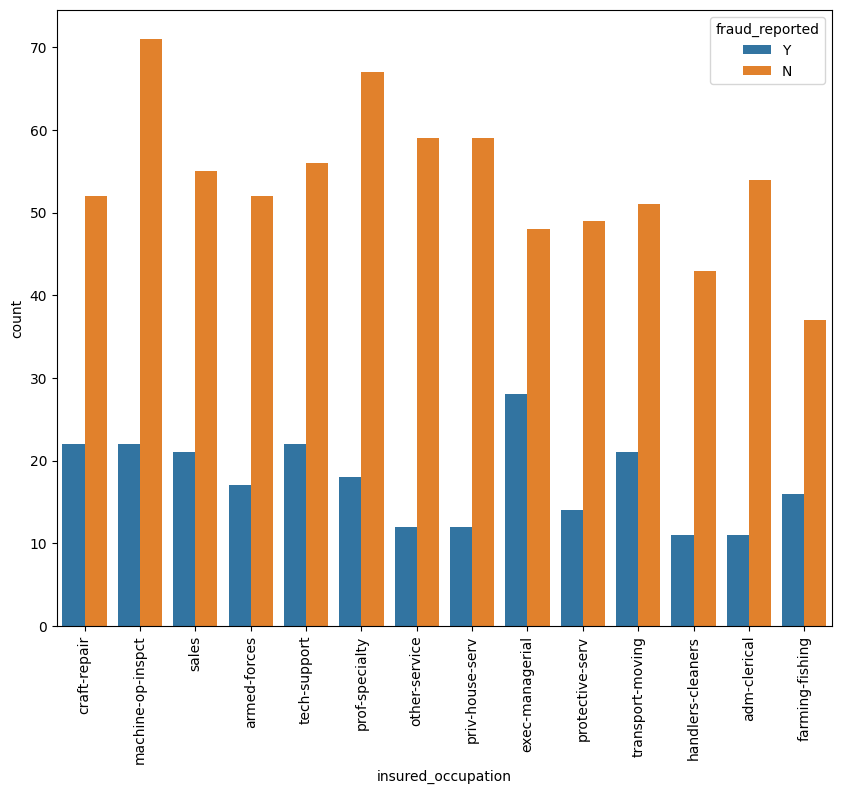

In [58]:
# Comparing insured_occupation vs Fraud_reported.

plt.figure(figsize = (10 , 8))
sns.countplot(x = ins_data['insured_occupation'] , data = ins_data , hue = ins_data['fraud_reported'])
plt.xticks(rotation = 90)
plt.show()

*The people who are in the position exec-managerial have high fraud reports compared to others.*

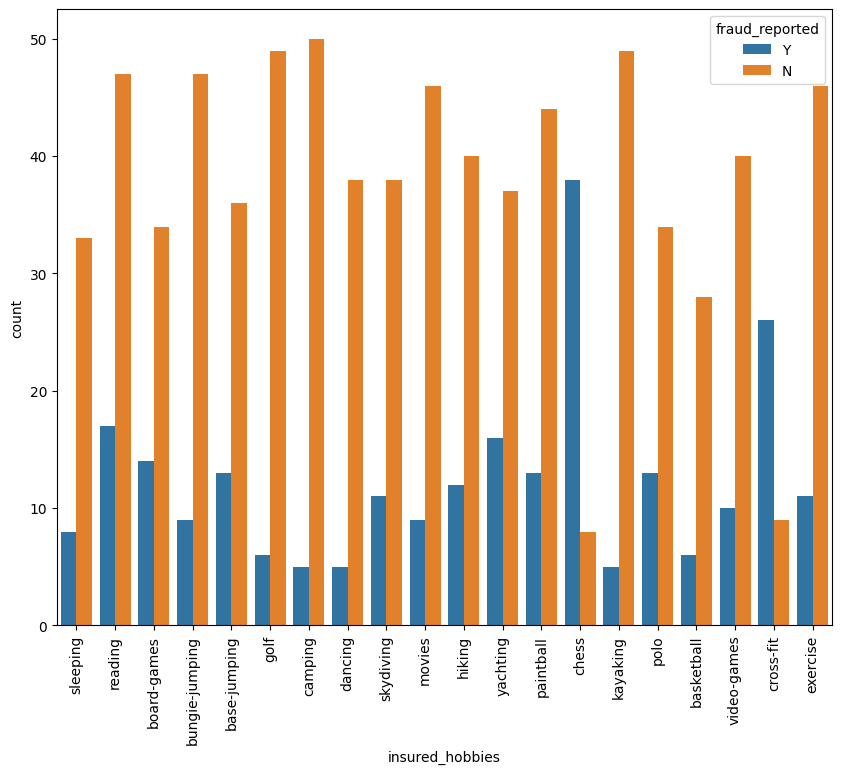

In [59]:
# Comparing insured_hobbies and fraud_reported.

plt.figure(figsize = (10 , 8))
sns.countplot(x = ins_data['insured_hobbies'] , hue = ins_data['fraud_reported'] , data = ins_data)
plt.xticks(rotation = 90)
plt.show()

*The fraud report is high for the people who have the hobby of playing chess and cross fit.*

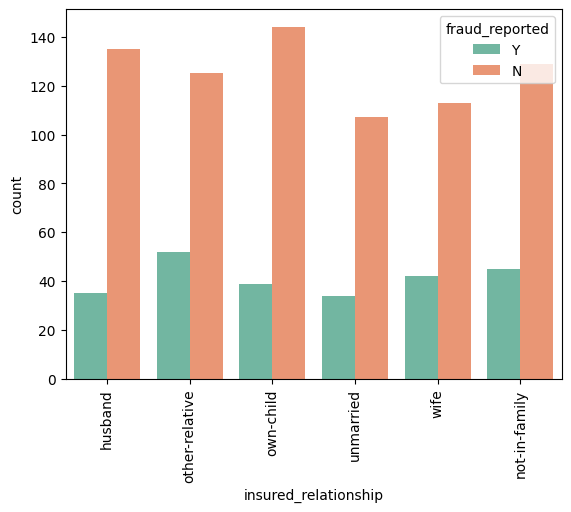

In [60]:
# Comparing insured_relationships and fraud_reported
sns.countplot(x = ins_data['insured_relationship'],data=ins_data,hue=ins_data['fraud_reported'],palette='Set2')
plt.xticks(rotation=90)
plt.show()

*The fraud report is high for the customers who have other relative and it is less for unmarried people.*

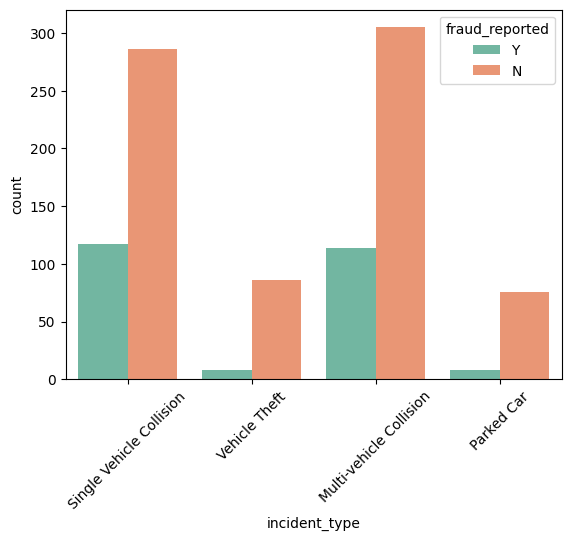

In [61]:
# Comparing incident_type and fraud_reported
sns.countplot(x = ins_data['incident_type'],data=ins_data,hue=ins_data['fraud_reported'],palette='Set2')
plt.xticks(rotation=45)
plt.show()

*The fraud reported when the type of incident is Multivehicle collision and single vehicle collision is high compared to Vehicle theft and parked vehicles.*

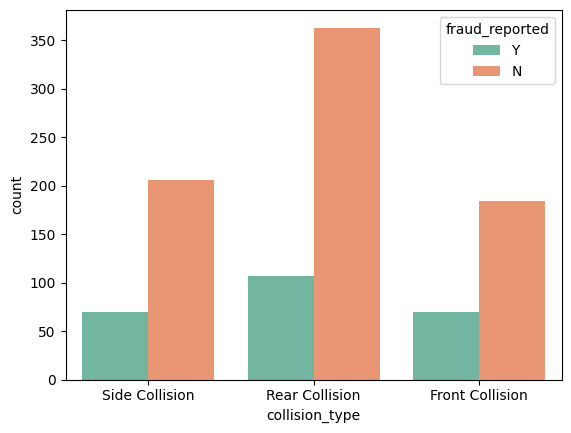

In [62]:
# Comparing collision_type and fraud_reported
sns.countplot(x = ins_data['collision_type'],data=ins_data,hue=ins_data['fraud_reported'],palette='Set2')
plt.show()

*The fraud reported is high when the  collision type is Rear Collision. When the collision type is Side and front the fraud reported is similar.*

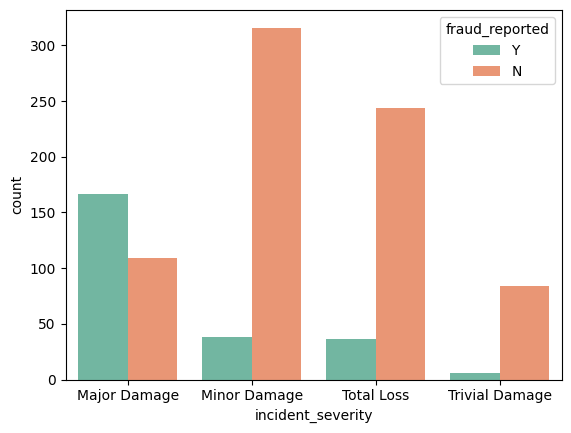

In [63]:
# Comparing incident_Severeity and fraud_reported
sns.countplot(x = ins_data['incident_severity'],data=ins_data, hue=ins_data['fraud_reported'] ,palette='Set2')
plt.show()

The fraud report is high when the type of damage is Major damage and fraud commited is the least when the type of damage Trivial Damage.

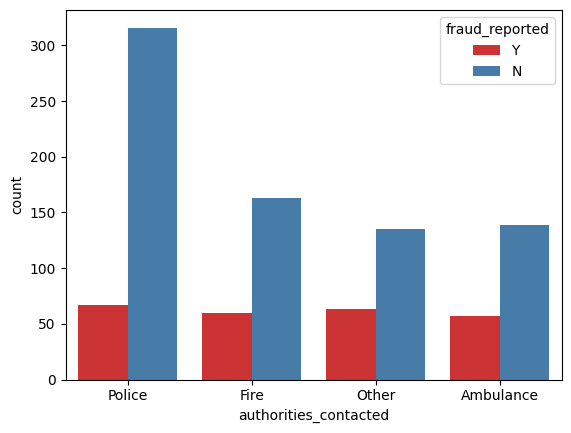

In [64]:
# Comparing authorities_contacted and fraud_reported
sns.countplot(x = ins_data['authorities_contacted'],data=ins_data,hue=ins_data['fraud_reported'],palette='Set1')
plt.show()

*The police contacted cases are very high.*

<ipython-input-65-c0849494b9e1>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.catplot(x=ins_data['incident_state'],data=ins_data,kind='count',col=ins_data['fraud_reported'],palette='RdBu')


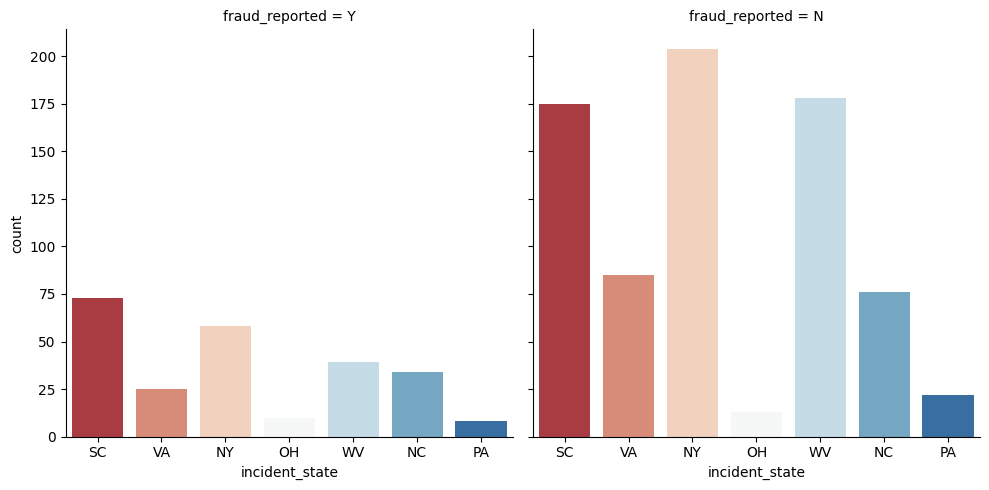

In [65]:
# Comparing incident_state and fraud_reported
sns.catplot(x=ins_data['incident_state'],data=ins_data,kind='count',col=ins_data['fraud_reported'],palette='RdBu')
plt.show()

*Most fradulant cases have taken place in the state "SC" followed by "NY" and the least in the state "PA".*

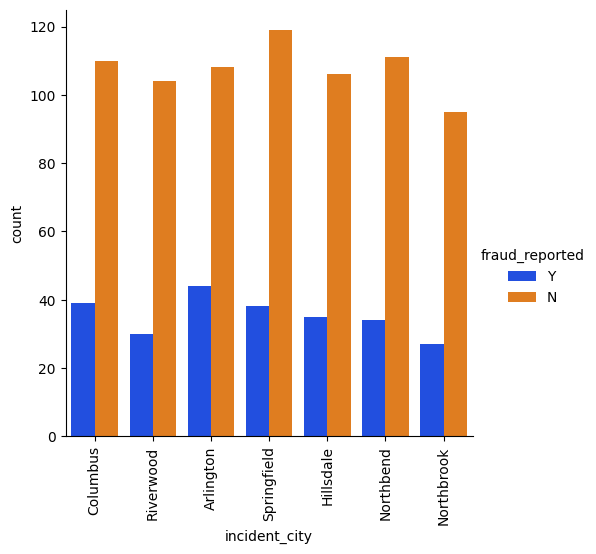

In [66]:
# Comparig incident_city and fraud_reported
sns.catplot(x = ins_data['incident_city'],kind='count',data=ins_data,hue=ins_data['fraud_reported'],palette="bright")
plt.xticks(rotation=90)
plt.show()

*The cities Riverwood and Northbrook have very less fraud reports compared to others.*

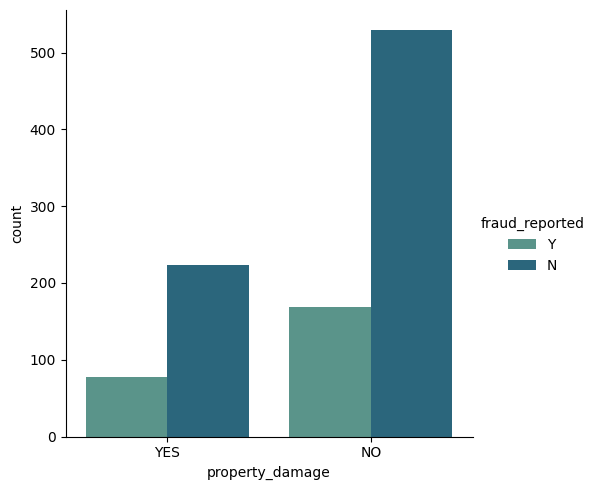

In [67]:
# Comparing property_damage and fraud_reported
sns.catplot(x = ins_data['property_damage'],kind='count',data=ins_data,hue=ins_data['fraud_reported'],palette="crest")
plt.show()

*The number of fraudulant cases reported when property damage is not there is higher.*

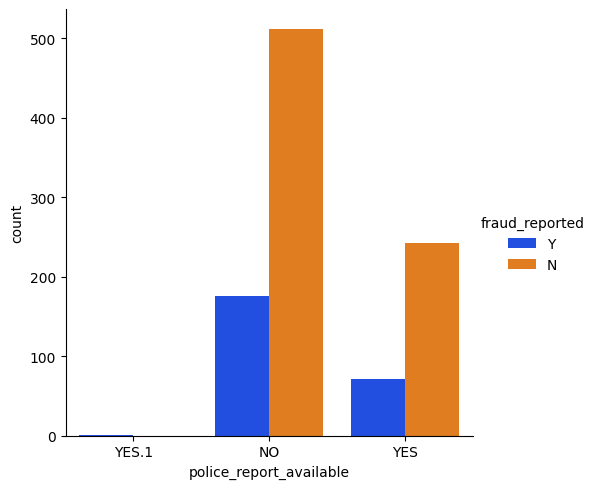

In [68]:
# Comparing police_report_available and fraud_reported
sns.catplot(x = ins_data['police_report_available'],kind='count',data=ins_data,hue=ins_data['fraud_reported'],palette="bright")
plt.show()

*The number of fraudulant cases are more when there are no police reports available.*

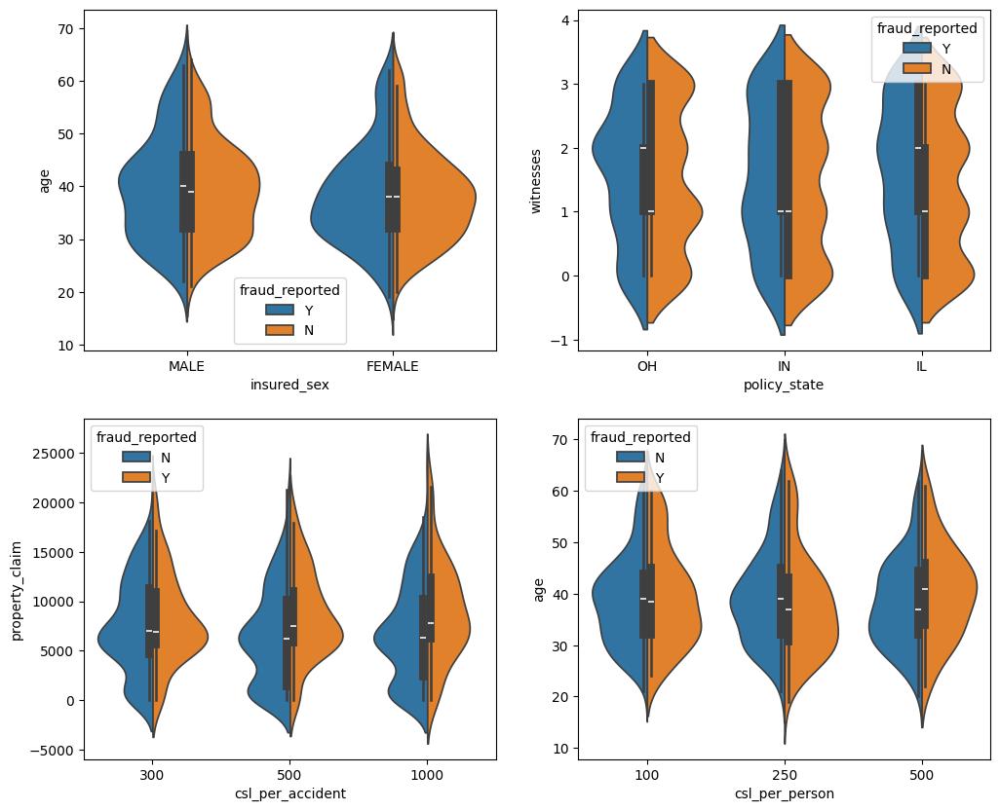

In [69]:
fig,axes=plt.subplots(2,2,figsize=(12,10))

# Comparing insured_sex and age
sns.violinplot(x=ins_data['insured_sex'],y=ins_data['age'],ax=axes[0,0],data=ins_data,hue=ins_data["fraud_reported"],split=True)

# Comparing policy_state and witnesses
sns.violinplot(x=ins_data['policy_state'],y=ins_data['witnesses'],ax=axes[0,1],data=ins_data,hue=ins_data["fraud_reported"],split=True)

# Comparing csl_per_accident and property_claim
sns.violinplot(x=ins_data['csl_per_accident'],y=ins_data['property_claim'],ax=axes[1,0],data=ins_data,hue=ins_data["fraud_reported"],split=True)

# Comparing csl_per_person and age
sns.violinplot(x=ins_data['csl_per_person'],y=ins_data['age'],ax=axes[1,1],data=ins_data,hue=ins_data["fraud_reported"],split=True)
plt.show()

The fraud report is high for both the males-females having age between 30-45.\
The people who own the policy state "IN" have high fraud report.\
The person who has csl per accidemt insurance by claimimg property in the range 5000-15000 have the fraud report.\
The csl_per_person with age 30-45 are facing the fraudulent reports.

# **Multi-Variate Analysis**

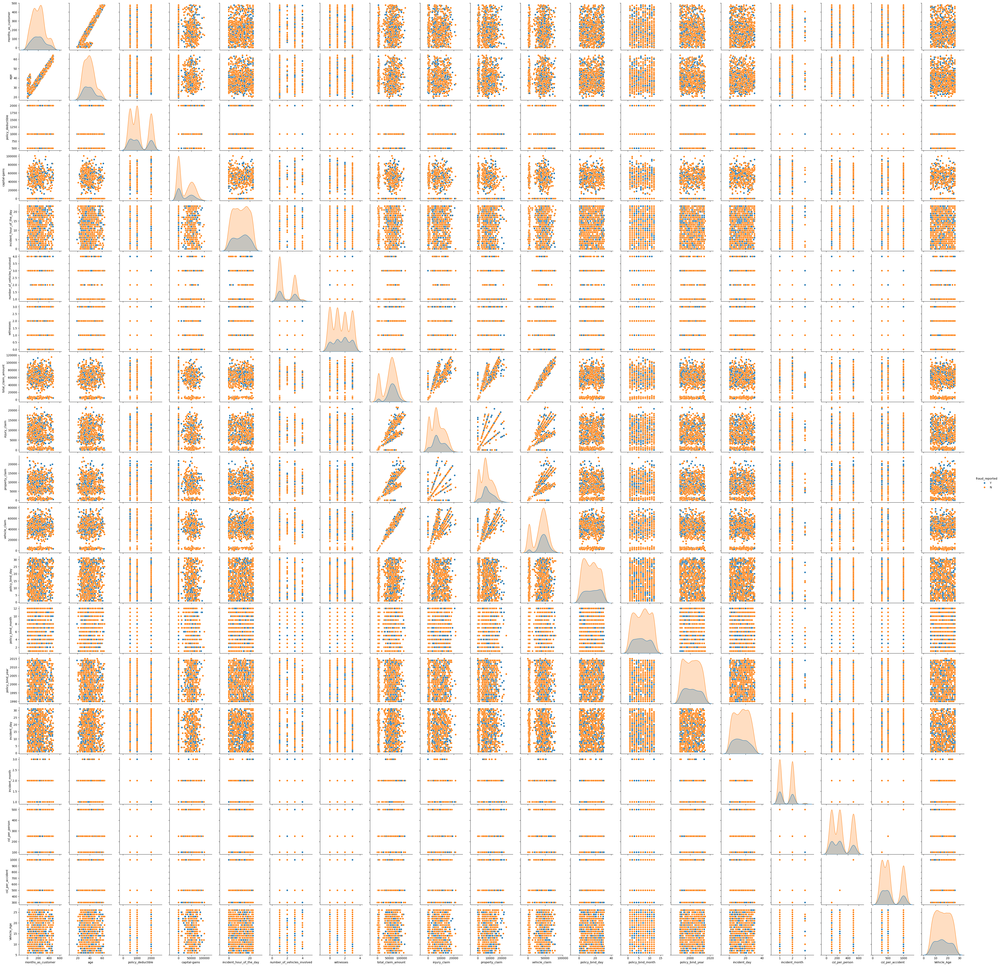

In [70]:
sns.pairplot(ins_data,hue="fraud_reported")
plt.show()

# *Checking for Outliers*

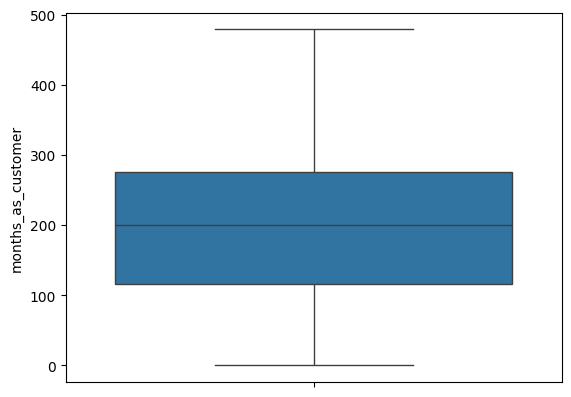

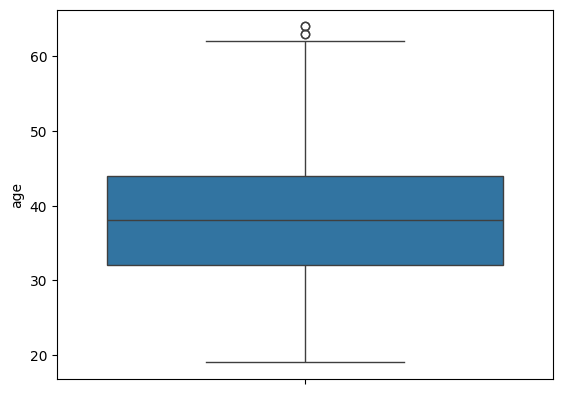

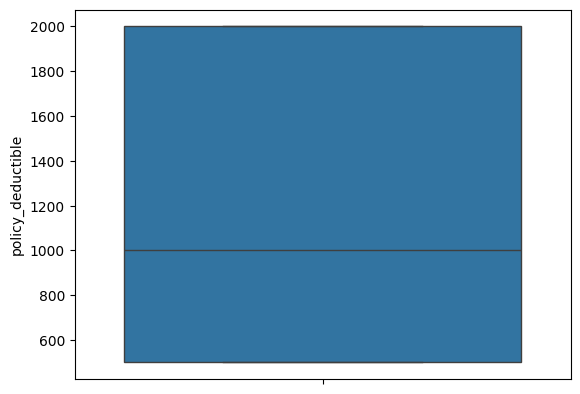

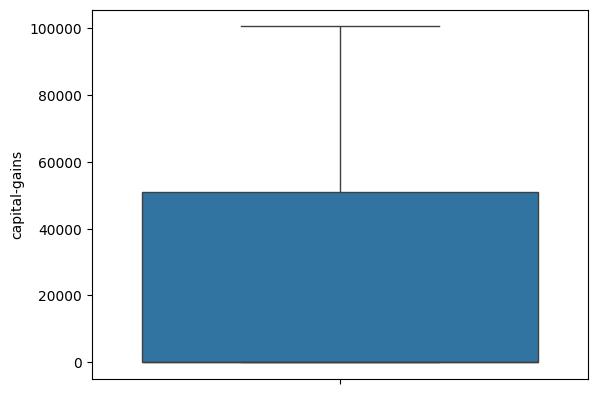

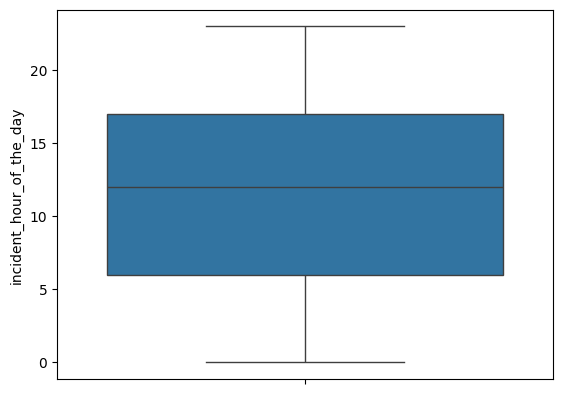

...

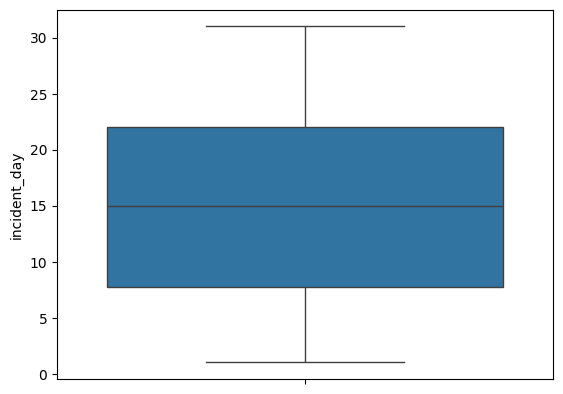

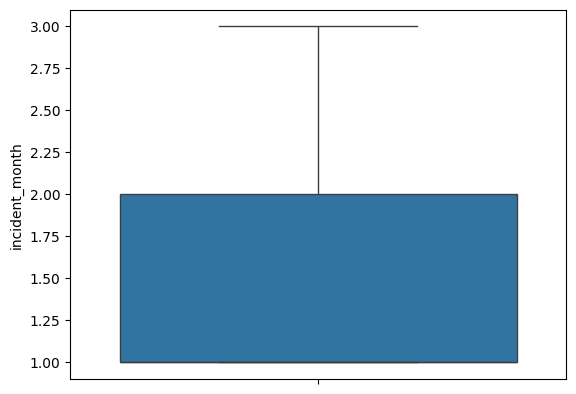

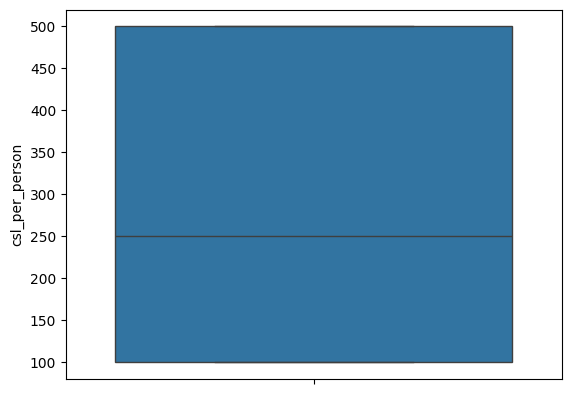

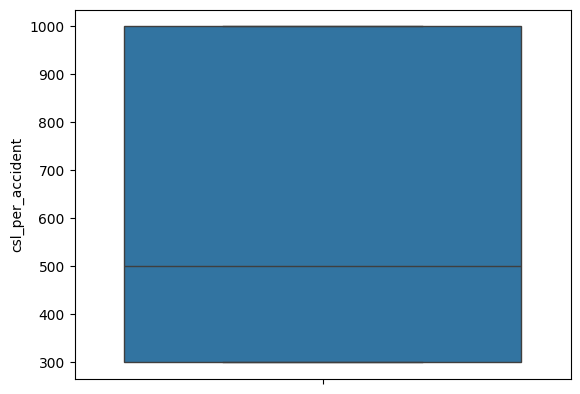

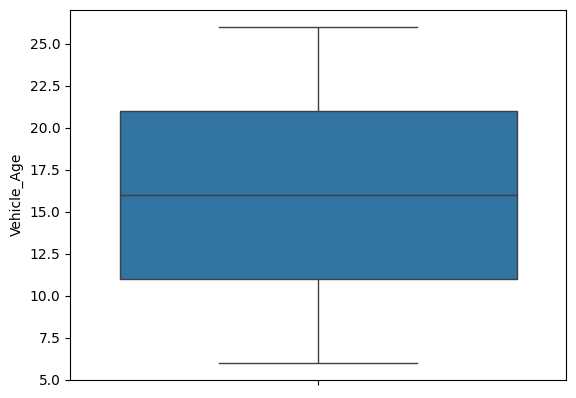

In [71]:
for i in numerical_col :
  sns.boxplot(ins_data[i])
  plt.show()

*The features:age, policy_annaul_premium, total_claim_amount, property_claim, incident_month have outliers.*

In [72]:
features = ins_data[['age', 'policy_annual_premium', 'total_claim_amount', 'property_claim' , 'incident_month']]
# from scipy.stats import zscore
# z = np.abs(zscore(features))
# z

#features = ins_data[['age', 'policy_annual_premium', 'total_claim_amount', 'property_claim']]
# Convert all columns in features to numeric
features = features.apply(pd.to_numeric, errors='coerce')
from scipy.stats import zscore
z = np.abs(zscore(features))
z

,age,policy_annual_premium,total_claim_amount,property_claim,incident_month
0,0.990836,0.616705,0.714257,1.165505,0.947587
1,0.334073,0.242521,1.807312,1.372696,0.947587
2,1.088913,0.642233,0.686362,0.736072,0.962871
3,0.224613,0.652886,0.403135,0.219722,0.947587
4,0.552994,1.341980,1.753121,1.399654,0.962871
...,...,...,...,...,...
995,0.103769,0.222884,1.305049,0.273817,0.962871
996,0.224613,0.739141,2.111466,2.214794,0.947587
997,0.541611,0.520739,0.558507,0.020826,0.947587
998,2.523284,0.411866,0.219110,0.451976,0.962871


In [73]:
new_data = ins_data[(z<3).all(axis=1)]
new_data.head()

,months_as_customer,age,policy_state,policy_deductible,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,...,auto_model,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
0,328,48,OH,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,...,92x,Y,17,10,2014,25,1,250,500,17
1,228,42,IN,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,...,E400,Y,27,6,2006,21,1,250,500,14
2,134,29,OH,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,...,RAM,N,6,9,2000,22,2,100,300,14
3,256,41,IL,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,...,Tahoe,Y,25,5,1990,10,1,250,500,7
4,228,44,IL,1000,1583.91,MALE,Associate,sales,board-games,unmarried,...,RSX,N,6,6,2014,17,2,500,1000,12


In [74]:
print(ins_data.shape)
print(new_data.shape)

(1000, 39)
(996, 39)


In [75]:
data_loss = (1000-996)/1000*100
data_loss

0.4

*We have lost 0.4%(4rows) of data after outliers remving.*

# *Checking for Skewness *

In [76]:
new_data.drop(['policy_state'] , axis = 1)

,months_as_customer,age,policy_deductible,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,...,auto_model,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
0,328,48,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,53300,...,92x,Y,17,10,2014,25,1,250,500,17
1,228,42,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,0,...,E400,Y,27,6,2006,21,1,250,500,14
2,134,29,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,35100,...,RAM,N,6,9,2000,22,2,100,300,14
3,256,41,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,48900,...,Tahoe,Y,25,5,1990,10,1,250,500,7
4,228,44,1000,1583.91,MALE,Associate,sales,board-games,unmarried,66000,...,RSX,N,6,6,2014,17,2,500,1000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,1000,1310.8,FEMALE,Masters,craft-repair,paintball,unmarried,0,...,Accord,N,16,7,1991,22,2,500,1000,15
996,285,41,1000,1436.79,FEMALE,PhD,prof-specialty,sleeping,wife,70900,...,Passat,N,5,1,2014,24,1,100,300,6
997,130,34,500,1383.49,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,...,Impreza,N,17,2,2003,23,1,250,500,25
998,458,62,2000,1356.92,MALE,Associate,handlers-cleaners,base-jumping,wife,0,...,A5,N,18,11,2011,26,2,500,1000,23


In [77]:
new_data.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_deductible',
       'policy_annual_premium', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'capital-gains', 'capital-loss', 'incident_type', 'collision_type',
       'incident_severity', 'authorities_contacted', 'incident_state',
       'incident_city', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'fraud_reported', 'policy_bind_day', 'policy_bind_month',
       'policy_bind_year', 'incident_day', 'incident_month', 'csl_per_person',
       'csl_per_accident', 'Vehicle_Age'],
      dtype='object')

In [78]:
new_data.drop(['insured_occupation'] , axis = 1 , inplace = True)

<ipython-input-78-61a412b4c491>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_data.drop(['insured_occupation'] , axis = 1 , inplace = True)


In [79]:
new_data.drop(['policy_state' , 'insured_sex', 'insured_education_level','incident_type', 'collision_type',
       'incident_severity', 'authorities_contacted', 'incident_state',
       'incident_city','property_damage','police_report_available','auto_make',
       'auto_model', 'fraud_reported','incident_day'], axis = 1 , inplace = True)

<ipython-input-79-a6694e5b9200>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_data.drop(['policy_state' , 'insured_sex', 'insured_education_level','incident_type', 'collision_type',


In [81]:
new_data.drop(['insured_hobbies'] , axis = 1 , inplace = True)

<ipython-input-81-f9b7cd1bce34>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_data.drop(['insured_hobbies'] , axis = 1 , inplace = True)


In [83]:
new_data.drop(['insured_relationship'] , axis = True , inplace = True)

<ipython-input-83-1f36aa198447>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_data.drop(['insured_relationship'] , axis = True , inplace = True)


In [84]:
new_data.skew()

months_as_customer             0.359605
age                            0.474526
policy_deductible              0.473229
policy_annual_premium          0.032042
capital-gains                   0.47885
capital-loss                  -0.393015
incident_hour_of_the_day      -0.039123
number_of_vehicles_involved    0.500364
bodily_injuries                 0.01075
witnesses                      0.025758
total_claim_amount            -0.593473
injury_claim                    0.26797
property_claim                  0.35713
vehicle_claim                 -0.619755
policy_bind_day                0.057251
policy_bind_month             -0.021269
policy_bind_year               0.058499
incident_month                 0.260283
csl_per_person                 0.413713
csl_per_accident               0.609316
Vehicle_Age                    0.049276
dtype: object

The following features contains skewness:

1. total_claim_amount
2. vehicle_claim
3. incident_month
4. csl_per_accident

*# Removing Skewness using yeo-johnson method*

In [85]:
skew = ["total_claim_amount","vehicle_claim","incident_month","csl_per_accident"]

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

In [86]:
new_data[skew] = scaler.fit_transform(new_data[skew].values)
new_data[skew].head()

<ipython-input-86-95388893c45a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_data[skew] = scaler.fit_transform(new_data[skew].values)


,total_claim_amount,vehicle_claim,incident_month,csl_per_accident
0,0.717556,0.754553,-0.966028,0.052612
1,-1.777785,-1.787353,-0.966028,0.052612
2,-0.716483,-0.820820,0.996033,-1.174021
3,0.392931,0.678427,-0.966028,0.052612
4,-1.730555,-1.740710,0.996033,1.313327


In [87]:
new_data.skew()

months_as_customer             0.359605
age                            0.474526
policy_deductible              0.473229
policy_annual_premium          0.032042
capital-gains                   0.47885
capital-loss                  -0.393015
incident_hour_of_the_day      -0.039123
number_of_vehicles_involved    0.500364
bodily_injuries                 0.01075
witnesses                      0.025758
total_claim_amount            -0.508953
injury_claim                    0.26797
property_claim                  0.35713
vehicle_claim                 -0.521354
policy_bind_day                0.057251
policy_bind_month             -0.021269
policy_bind_year               0.058499
incident_month                 0.107284
csl_per_person                 0.413713
csl_per_accident               0.110964
Vehicle_Age                    0.049276
dtype: object

*The Skewness removed from dataset successfully.*

<ipython-input-88-3881a75cd7dd>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_data[i])


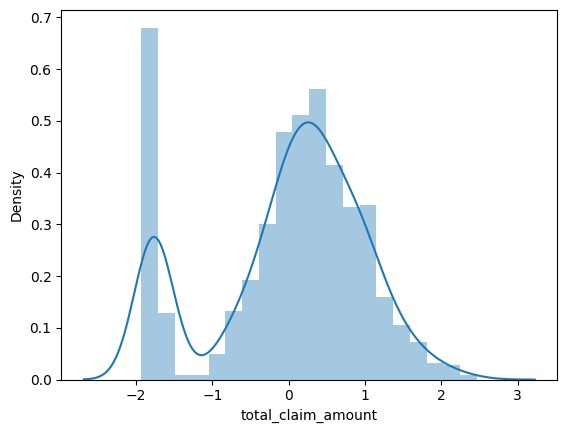

<ipython-input-88-3881a75cd7dd>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_data[i])


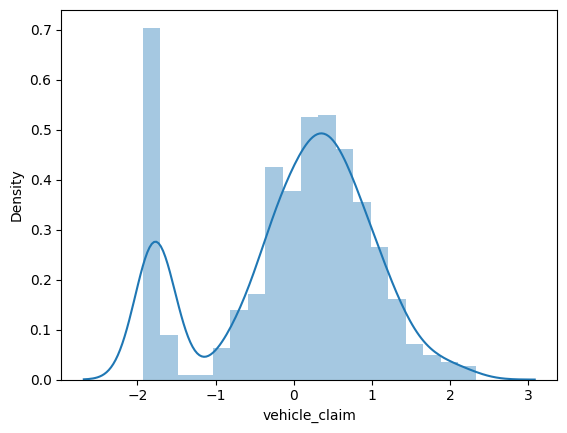

<ipython-input-88-3881a75cd7dd>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_data[i])


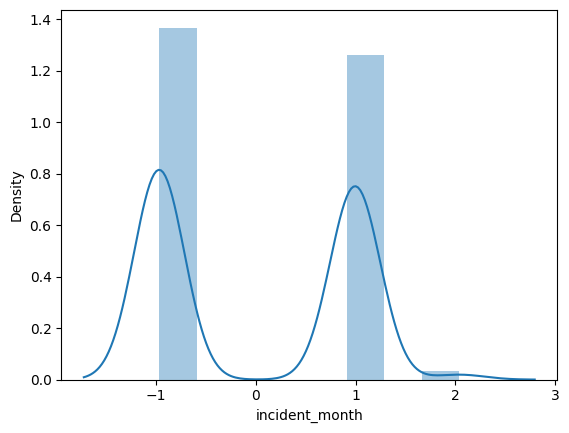

<ipython-input-88-3881a75cd7dd>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_data[i])


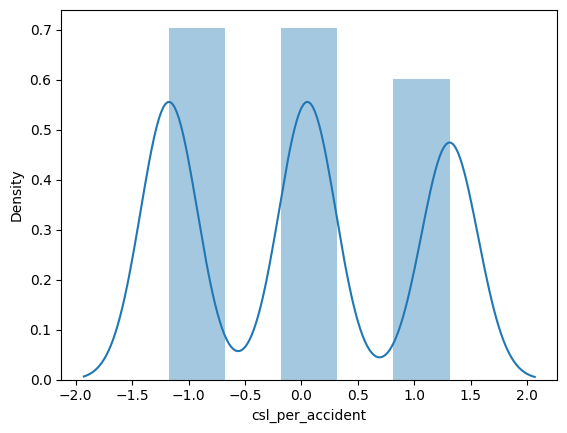

In [88]:
for i in new_data[skew] :
  sns.distplot(new_data[i])
  plt.show()

*The data looks almost normally distributed.*

# *Encoding the categorical Data *

In [94]:
new_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 996 entries, 0 to 999
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           996 non-null    int64  
 1   age                          996 non-null    int64  
 2   policy_deductible            996 non-null    int64  
 3   policy_annual_premium        996 non-null    object 
 4   capital-gains                996 non-null    int64  
 5   capital-loss                 996 non-null    object 
 6   incident_hour_of_the_day     996 non-null    int64  
 7   number_of_vehicles_involved  996 non-null    int64  
 8   bodily_injuries              996 non-null    object 
 9   witnesses                    996 non-null    int64  
 10  total_claim_amount           996 non-null    float64
 11  injury_claim                 996 non-null    int64  
 12  property_claim               996 non-null    int64  
 13  vehicle_claim            

In [101]:
from sklearn.preprocessing import LabelEncoder

Le = LabelEncoder()
# iterate through each column in the cat_col list
for col in cat_col:
  # check if the column is of object type (string)
  if ins_data[col].dtype == 'object':
    # if it is, apply the LabelEncoder to that column
    # Convert the column to strings before applying LabelEncoder
    ins_data[col] = ins_data[col].astype(str)
    ins_data[col] = Le.fit_transform(ins_data[col])
ins_data[cat_col].head()

,policy_state,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,bodily_injuries,police_report_available,auto_make,auto_model,fraud_reported
0,2,579,1,4,2,17,0,354,2,2,0,3,4,1,1,2,2,10,1,1
1,1,243,1,4,6,15,2,353,3,1,1,3,5,5,0,0,0,8,12,1
2,2,587,0,6,11,2,3,353,0,1,1,3,1,1,0,3,0,4,30,0
3,0,590,0,6,1,2,4,253,2,0,0,3,2,0,0,1,0,3,34,1
4,0,749,1,0,11,2,4,139,3,1,1,3,1,0,0,0,0,0,31,0


# Correlation

In [102]:
corr = new_data.corr()
corr

,months_as_customer,age,policy_deductible,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,...,injury_claim,property_claim,vehicle_claim,policy_bind_day,policy_bind_month,policy_bind_year,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
months_as_customer,1.000000,0.922092,0.023512,-0.003378,0.007601,0.020771,0.068962,0.013609,-0.010994,0.063530,...,0.066416,0.041157,0.062392,0.058051,-0.004430,-0.046010,-0.049327,-0.022063,-0.022928,-0.001287
age,0.922092,1.000000,0.026772,0.005890,-0.006333,0.008192,0.085509,0.021140,-0.017339,0.056658,...,0.075480,0.064230,0.062165,0.058530,0.005683,-0.035505,-0.042259,-0.012844,-0.012459,-0.003268
policy_deductible,0.023512,0.026772,1.000000,-0.008445,0.035950,-0.024018,0.059733,0.051317,-0.023412,0.069433,...,0.040337,0.069537,0.005902,0.001948,-0.026390,-0.048465,-0.030969,0.006634,0.006179,-0.027497
policy_annual_premium,-0.003378,0.005890,-0.008445,1.000000,-0.009757,0.029835,-0.003001,-0.044711,0.025399,0.006365,...,-0.024031,-0.007964,0.012961,-0.040755,-0.003040,0.001650,-0.048497,0.028569,0.030755,0.040439
capital-gains,0.007601,-0.006333,0.035950,-0.009757,1.000000,-0.049528,-0.018367,0.062047,0.053731,-0.017785,...,0.027397,-0.003947,0.015089,-0.004177,0.020270,0.041789,-0.036086,0.003241,0.004182,-0.031282
capital-loss,0.020771,0.008192,-0.024018,0.029835,-0.049528,1.000000,-0.028729,-0.013205,-0.027711,-0.041611,...,-0.041919,-0.023884,-0.030884,-0.023172,-0.029116,-0.025891,0.009385,-0.032792,-0.034327,0.056410
incident_hour_of_the_day,0.068962,0.085509,0.059733,-0.003001,-0.018367,-0.028729,1.000000,0.121555,-0.039657,0.009373,...,0.168915,0.179917,0.212529,-0.011552,0.007101,0.037596,-0.009485,-0.001586,-0.000614,-0.023178
number_of_vehicles_involved,0.013609,0.021140,0.051317,-0.044711,0.062047,-0.013205,0.121555,1.000000,0.014391,-0.011877,...,0.224700,0.221560,0.261934,-0.000295,-0.029637,0.028498,0.042683,-0.019306,-0.019764,-0.032343
bodily_injuries,-0.010994,-0.017339,-0.023412,0.025399,0.053731,-0.027711,-0.039657,0.014391,1.000000,-0.003377,...,0.048743,0.035491,0.043651,-0.044891,-0.028476,0.032093,-0.001354,0.001755,-0.000339,0.018459
witnesses,0.063530,0.056658,0.069433,0.006365,-0.017785,-0.041611,0.009373,-0.011877,-0.003377,1.000000,...,-0.025750,0.050073,-0.023812,-0.011447,0.023485,0.052651,0.015845,0.065395,0.069088,-0.046001


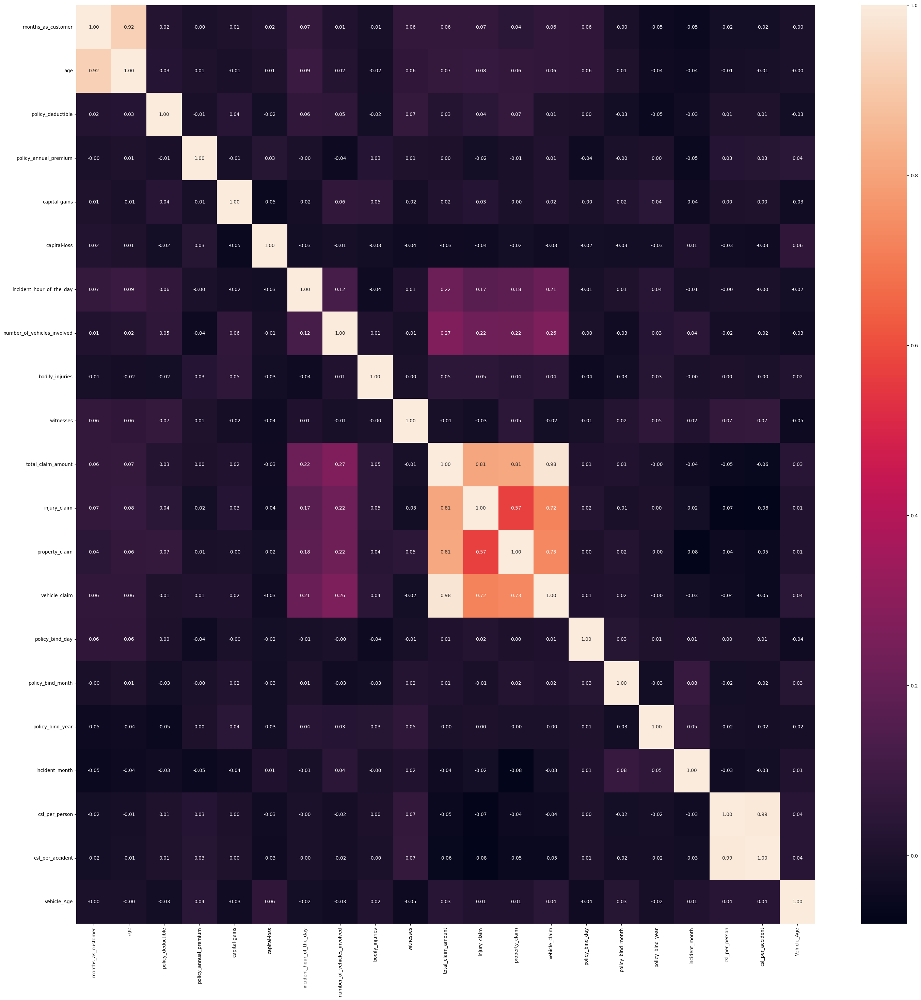

In [103]:
# Visualizing by Heatmap

plt.figure(figsize = (35,35))
sns.heatmap(corr , annot = True , fmt = '0.2f')
plt.show()

Observations from correlation:
1. There is very less correlation between the target and the label.
2. We can observe the most of the columns are highly correlated with each other which leads to the multicollinearity problem.
3. We will check the VIF value to overcome with this multicollinearity problem.

In [106]:
x = ins_data.drop(['fraud_reported'] , axis = 1)
y = ins_data['fraud_reported']

# Standard Scaler

In [107]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x) , columns = x.columns)
x.head()

,months_as_customer,age,policy_state,policy_deductible,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,...,auto_make,auto_model,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
0,1.078140,0.990836,1.187173,-0.222383,0.296253,1.076953,0.530931,-1.158316,1.281737,-1.437957,...,0.856466,-1.645743,0.176292,0.983684,1.684992,1.154424,-0.947587,-0.140228,-0.279173,0.183440
1,0.208995,0.334073,-0.016856,1.412784,-0.879770,1.076953,0.530931,-0.162558,0.929078,-0.247595,...,0.360539,-0.657470,1.312191,-0.159802,0.597550,0.692885,-0.947587,-0.140228,-0.279173,-0.315491
2,-0.608002,-1.088913,1.187173,1.412784,0.324253,-0.928546,1.557877,1.082141,-1.363201,0.347586,...,-0.631315,0.959702,-1.073198,0.697813,-0.218032,0.808270,0.962871,-1.068892,-0.975366,-0.315491
3,0.452355,0.224613,-1.220886,1.412784,0.334753,-0.928546,1.557877,-1.407256,-1.363201,0.942766,...,-0.879279,1.319074,1.085011,-0.445674,-1.577335,-0.576347,-0.947587,-0.140228,-0.279173,-1.479664
4,0.208995,0.552994,-1.220886,-0.222383,0.891264,1.076953,-1.522961,1.082141,-1.363201,0.942766,...,-1.623169,1.049545,-1.073198,-0.159802,1.684992,0.231346,0.962871,1.407545,1.461308,-0.648112


# Checking for Multicolinearity

In [108]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


,VIF values,Features
0,6.853153,months_as_customer
1,6.855520,age
2,1.034655,policy_state
3,1.048289,policy_deductible
4,1.039608,policy_annual_premium
5,1.033795,insured_sex
6,1.052832,insured_education_level
7,1.015486,insured_occupation
8,1.049817,insured_hobbies
9,1.046578,insured_relationship


*Drop total_claim_amount as VIF>10.*

In [109]:
x.drop(['total_claim_amount'] , axis = 1 , inplace = True)

In [111]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF values,Features
0,6.853153,months_as_customer
1,6.855520,age
2,1.034655,policy_state
3,1.048289,policy_deductible
4,1.039608,policy_annual_premium
5,1.033795,insured_sex
6,1.052832,insured_education_level
7,1.015486,insured_occupation
8,1.049817,insured_hobbies
9,1.046578,insured_relationship


*Drop csl_per_person as VIF>10.*

In [112]:
x.drop(['csl_per_person'] , axis = 1 , inplace = True)

In [113]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF values,Features
0,6.849868,months_as_customer
1,6.852643,age
2,1.033748,policy_state
3,1.048272,policy_deductible
4,1.036757,policy_annual_premium
5,1.028707,insured_sex
6,1.052824,insured_education_level
7,1.015328,insured_occupation
8,1.048613,insured_hobbies
9,1.042029,insured_relationship


*We have successfully removed Multicolinearity from our dataset.*

In [114]:
y.value_counts()

fraud_reported
0    753
1    247
Name: count, dtype: int64

# Oversampling

In [115]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x , y = SM.fit_resample(x , y)

In [116]:
y.value_counts()

fraud_reported
1    753
0    753
Name: count, dtype: int64

# **MODEL BUILDING**

*Searching for the best Random State.*

In [117]:
from sklearn.model_selection import train_test_split as TTS
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

maxAccu = 0
maxRS = 0
for i in range(1,200) :
  x_train , x_test , y_train , y_test = TTS(x , y , test_size = 0.30 , random_state = i)
  RFC = RandomForestClassifier()
  RFC.fit(x_train , y_train)
  pred = RFC.predict(x_test)
  acc = accuracy_score(y_test , pred)
  if acc>maxAccu :
    maxAccu = acc
    maxRS = i
print("Best Accuracy Score is " , maxAccu , "at random state" , maxRS)

Best Accuracy Score is  0.918141592920354 at random state 15


In [118]:
x_train,x_test,y_train,y_test=TTS(x,y,test_size=.30,random_state=maxRS)

In [119]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from xgboost import XGBClassifier as xgb
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score

# ***Random Forest Classifier***

In [120]:
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)
predRFC = RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test,predRFC))
print(classification_report(y_test,predRFC))

0.9137168141592921
[[200  17]
 [ 22 213]]
              precision    recall  f1-score   support

           0       0.90      0.92      0.91       217
           1       0.93      0.91      0.92       235

    accuracy                           0.91       452
   macro avg       0.91      0.91      0.91       452
weighted avg       0.91      0.91      0.91       452



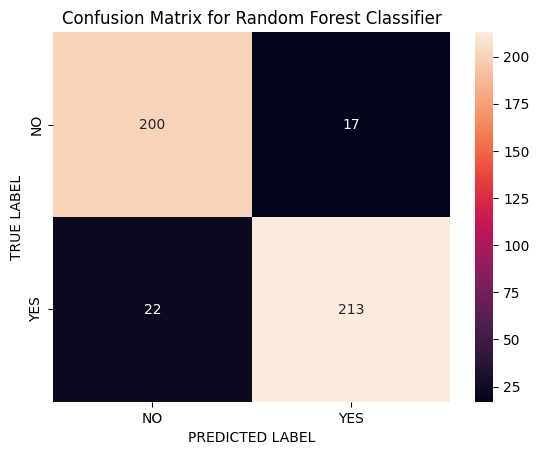

In [121]:
cm = confusion_matrix(y_test,predRFC)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

sns.heatmap(cm, annot = True, fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Random Forest Classifier')
plt.show()

# ***Decision Tree Classifier***

In [122]:
DTC = DecisionTreeClassifier()
DTC.fit(x_train , y_train)
predDTC = DTC.predict(x_test)
print(accuracy_score(y_test , predDTC))
print(confusion_matrix(y_test , predDTC))
print(classification_report(y_test,predDTC))

0.838495575221239
[[178  39]
 [ 34 201]]
              precision    recall  f1-score   support

           0       0.84      0.82      0.83       217
           1       0.84      0.86      0.85       235

    accuracy                           0.84       452
   macro avg       0.84      0.84      0.84       452
weighted avg       0.84      0.84      0.84       452



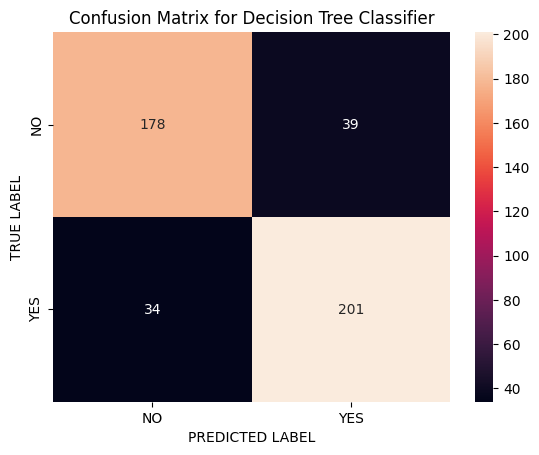

In [123]:
cm = confusion_matrix(y_test,predDTC)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

sns.heatmap(cm, annot = True,fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Decision Tree Classifier')
plt.show()

# ***Support Vector Machine Classifier***

In [124]:
svc = SVC()
svc.fit(x_train,y_train)
predSVC = svc.predict(x_test)
print(accuracy_score(y_test , predSVC))
print(confusion_matrix(y_test , predSVC))
print(classification_report(y_test,predSVC))

0.8761061946902655
[[185  32]
 [ 24 211]]
              precision    recall  f1-score   support

           0       0.89      0.85      0.87       217
           1       0.87      0.90      0.88       235

    accuracy                           0.88       452
   macro avg       0.88      0.88      0.88       452
weighted avg       0.88      0.88      0.88       452



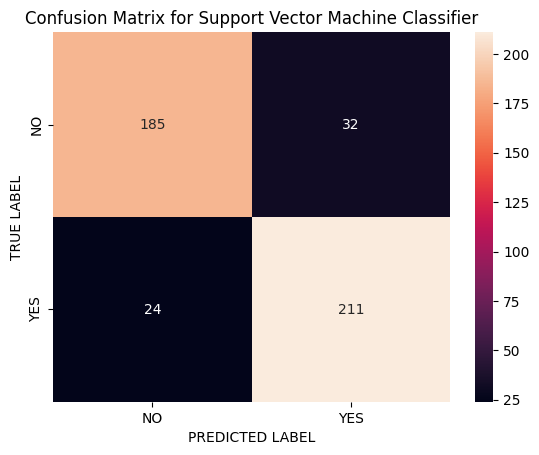

In [125]:
cm = confusion_matrix(y_test , predSVC)

x_axis_labels = ["NO" , "YES"]
y_axis_labels = ["NO" , "YES"]


sns.heatmap(cm, annot = True,fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Support Vector Machine Classifier')
plt.show()

# ***Gradient Booster Classifier***

In [126]:
GB = GradientBoostingClassifier()
GB.fit(x_train,y_train)
predGB = GB.predict(x_test)
print(accuracy_score(y_test,predGB))
print(confusion_matrix(y_test,predGB))
print(classification_report(y_test,predGB))

0.9048672566371682
[[194  23]
 [ 20 215]]
              precision    recall  f1-score   support

           0       0.91      0.89      0.90       217
           1       0.90      0.91      0.91       235

    accuracy                           0.90       452
   macro avg       0.90      0.90      0.90       452
weighted avg       0.90      0.90      0.90       452



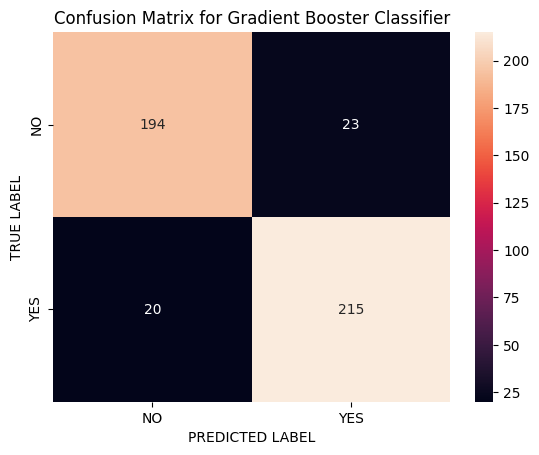

In [128]:
cm = confusion_matrix(y_test , predGB)

x_axis_labels = ["NO" , "YES"]
y_axis_labels = ["NO" , "YES"]


sns.heatmap(cm, annot = True,fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Gradient Booster Classifier')
plt.show()

# ***AdaBoost Classifier***

In [129]:
ABC = AdaBoostClassifier()
ABC.fit(x_train,y_train)
predABC = ABC.predict(x_test)
print(accuracy_score(y_test,predABC))
print(confusion_matrix(y_test,predABC))
print(classification_report(y_test,predABC))

0.9026548672566371
[[196  21]
 [ 23 212]]
              precision    recall  f1-score   support

           0       0.89      0.90      0.90       217
           1       0.91      0.90      0.91       235

    accuracy                           0.90       452
   macro avg       0.90      0.90      0.90       452
weighted avg       0.90      0.90      0.90       452



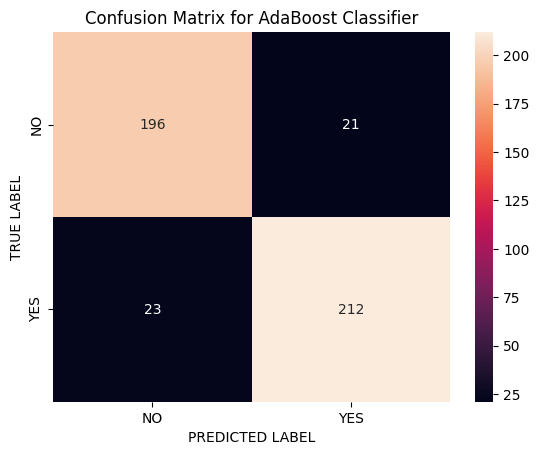

In [130]:
cm = confusion_matrix(y_test,predABC)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

sns.heatmap(cm, annot = True, fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for AdaBoost Classifier')
plt.show()

# ***Bagging Classifier***

In [131]:
BC = BaggingClassifier()
BC.fit(x_train,y_train)
predBC = BC.predict(x_test)
print(accuracy_score(y_test,predBC))
print(confusion_matrix(y_test,predBC))
print(classification_report(y_test,predBC))

0.8960176991150443
[[202  15]
 [ 32 203]]
              precision    recall  f1-score   support

           0       0.86      0.93      0.90       217
           1       0.93      0.86      0.90       235

    accuracy                           0.90       452
   macro avg       0.90      0.90      0.90       452
weighted avg       0.90      0.90      0.90       452



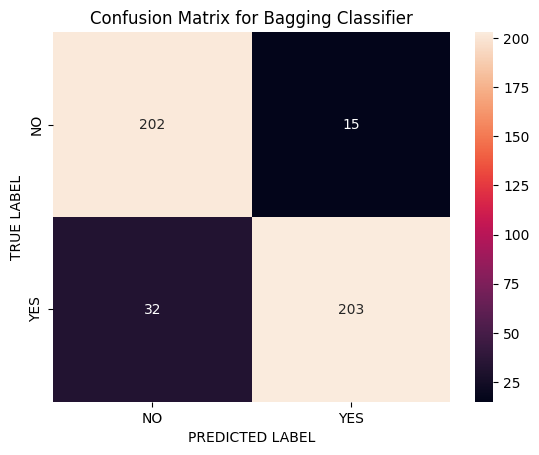

In [132]:
cm = confusion_matrix(y_test,predBC)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

sns.heatmap(cm, annot = True, fmt = ".0f", xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Bagging Classifier')
plt.show()

# ***Extra Tree Classifier***

In [133]:
ET = ExtraTreesClassifier()
ET.fit(x_train,y_train)
predET = ET.predict(x_test)
print(accuracy_score(y_test,predET))
print(confusion_matrix(y_test,predET))
print(classification_report(y_test,predET))

0.9336283185840708
[[200  17]
 [ 13 222]]
              precision    recall  f1-score   support

           0       0.94      0.92      0.93       217
           1       0.93      0.94      0.94       235

    accuracy                           0.93       452
   macro avg       0.93      0.93      0.93       452
weighted avg       0.93      0.93      0.93       452



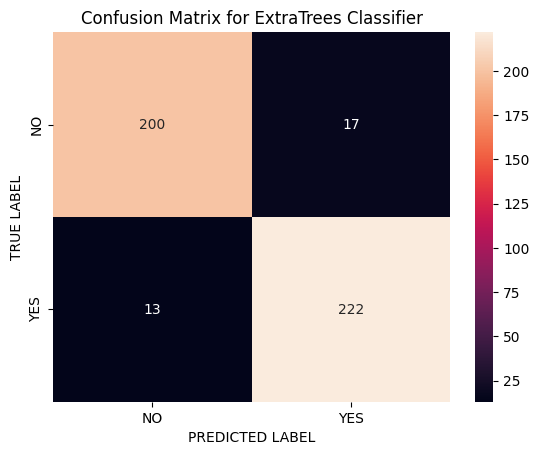

In [134]:
cm = confusion_matrix(y_test,predET)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

sns.heatmap(cm, annot = True, fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for ExtraTrees Classifier')
plt.show()

# ***XG BOOST CLASSIFIER***

In [135]:
XGB = xgb(verbosity=0)
XGB.fit(x_train,y_train)
predXGB = XGB.predict(x_test)
print(accuracy_score(y_test,predXGB))
print(confusion_matrix(y_test,predXGB))
print(classification_report(y_test,predXGB))

0.9247787610619469
[[195  22]
 [ 12 223]]
              precision    recall  f1-score   support

           0       0.94      0.90      0.92       217
           1       0.91      0.95      0.93       235

    accuracy                           0.92       452
   macro avg       0.93      0.92      0.92       452
weighted avg       0.93      0.92      0.92       452



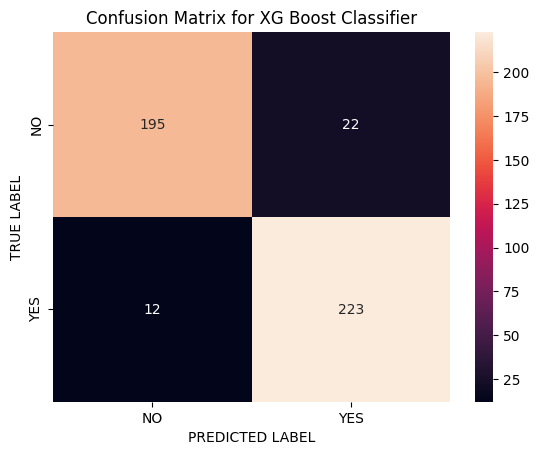

In [136]:
cm = confusion_matrix(y_test,predXGB)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

sns.heatmap(cm, annot = True, fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for XG Boost Classifier')
plt.show()

# ***Checking Cross Validation Score***

In [137]:
from sklearn.model_selection import cross_val_score

In [138]:
print("Cross_Validation_Score using Random Forest Classifier:",cross_val_score(RFC,x,y,cv=5).mean())

Cross_Validation_Score using Random Forest Classifier: 0.8779124771732196


In [139]:
print("Cross_Validation_Score using Decision Tree Classifier:",cross_val_score(DTC,x,y,cv=5).mean())

Cross_Validation_Score using Decision Tree Classifier: 0.829429495500649


In [140]:
print("Cross_Validation_Score using Support Vector Classifier:",cross_val_score(svc,x,y,cv=5).mean())

Cross_Validation_Score using Support Vector Classifier: 0.8606059272623264


In [141]:
print("Cross_Validation_Score using Gradient Boosting Classifier:",cross_val_score(GB,x,y,cv=5).mean())

Cross_Validation_Score using Gradient Boosting Classifier: 0.8706013069019385


In [142]:
print("Cross_Validation_Score using AdaBoosting Classifier:",cross_val_score(ABC,x,y,cv=5).mean())

Cross_Validation_Score using AdaBoosting Classifier: 0.8666343974830036


In [143]:
print("Cross_Validation_Score using Bagging Classifier:",cross_val_score(BC,x,y,cv=5).mean())

Cross_Validation_Score using Bagging Classifier: 0.8573298717299949


In [144]:
print("Cross_Validation_Score using ExtraTrees Classifier:",cross_val_score(ET,x,y,cv=5).mean())

Cross_Validation_Score using ExtraTrees Classifier: 0.9110646630437174


In [145]:
print("Cross_Validation_Score using XG Boost Classifier:",cross_val_score(XGB,x,y,cv=5).mean())

Cross_Validation_Score using XG Boost Classifier: 0.8891795560053684


As per the above observations :     

# *Best Model - ExtraTrees Classifiers*

# ***Hyperparameter Tuning***

In [146]:
from sklearn.model_selection import GridSearchCV

parameters = {'criterion':['gini','entrophy'],
             'max_features':['auto','sqrt','log2'],
             'max_depth':[0,10,20],
             'n_jobs':[-2,-1,1],
             'n_estimators':[50,100,200,300]}

In [147]:
GCV = GridSearchCV(ExtraTreesClassifier(),parameters,cv=5)

In [148]:
GCV.fit(x_train,y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entrophy'],
                         'max_depth': [0, 10, 20],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1]})

In [149]:
GCV.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'max_features': 'auto',
 'n_estimators': 300,
 'n_jobs': -2}

In [150]:
Insurance_model =  ExtraTreesClassifier(criterion='gini',max_features='auto',max_depth=20,n_estimators=300,n_jobs=-2)
Insurance_model.fit(x_train,y_train)
pred = Insurance_model.predict(x_test)
acc = accuracy_score(y_test,pred)
print(acc*100)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


92.47787610619469


# *We get accuracy of 92.47% after hyperparameter tuning.*

# Plotting ROC and compare AUC for all the models used


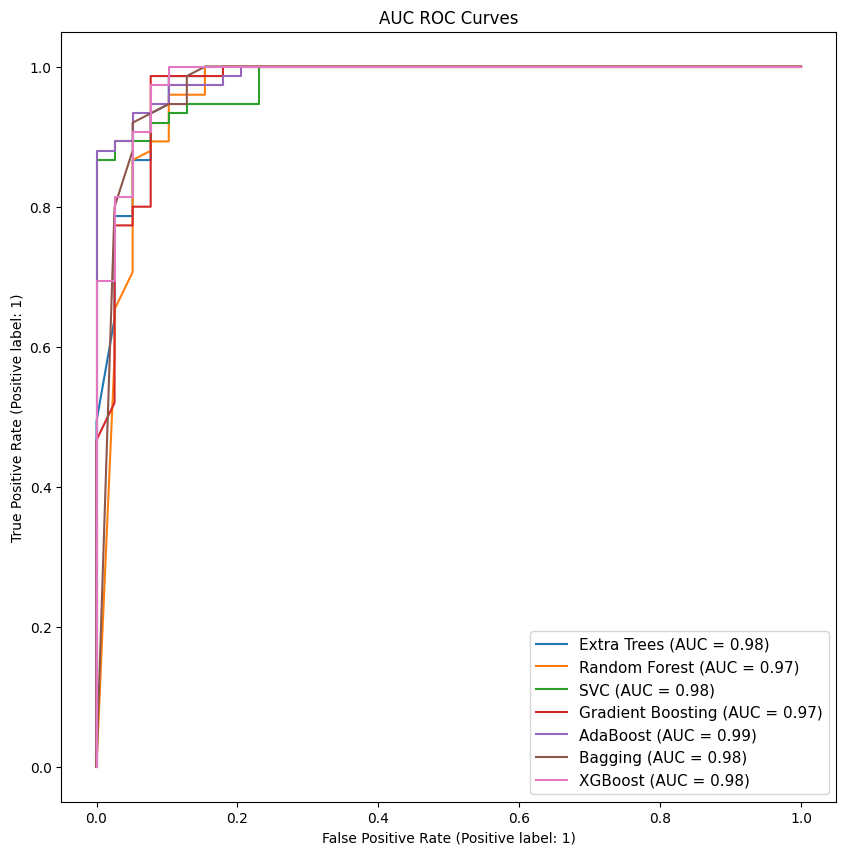

In [153]:
import matplotlib.pyplot as plt
from sklearn import datasets, model_selection, metrics
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import RocCurveDisplay

# Load dataset and split into training and testing sets
data = datasets.load_breast_cancer()
X, y = data.data, data.target
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.2, random_state=15)

# Initialize models
ET = ExtraTreesClassifier(random_state=15)
RFC = RandomForestClassifier(random_state=15)
svc = SVC(kernel='linear', probability=True, random_state=15)
GB = GradientBoostingClassifier(random_state=15)
ABC = AdaBoostClassifier(random_state=15)
BC = BaggingClassifier(random_state=15)
XGB = XGBClassifier(random_state=15)

# Fit models
ET.fit(X_train, y_train)
RFC.fit(X_train, y_train)
svc.fit(X_train, y_train)
GB.fit(X_train, y_train)
ABC.fit(X_train, y_train)
BC.fit(X_train, y_train)
XGB.fit(X_train, y_train)

# Plot ROC curves using RocCurveDisplay
fig, ax = plt.subplots(figsize=(10, 10))
RocCurveDisplay.from_estimator(ET, X_test, y_test, ax=ax, name='Extra Trees')
RocCurveDisplay.from_estimator(RFC, X_test, y_test, ax=ax, name='Random Forest')
RocCurveDisplay.from_estimator(svc, X_test, y_test, ax=ax, name='SVC')
RocCurveDisplay.from_estimator(GB, X_test, y_test, ax=ax, name='Gradient Boosting')
RocCurveDisplay.from_estimator(ABC, X_test, y_test, ax=ax, name='AdaBoost')
RocCurveDisplay.from_estimator(BC, X_test, y_test, ax=ax, name='Bagging')
RocCurveDisplay.from_estimator(XGB, X_test, y_test, ax=ax, name='XGBoost')

# Customize and show plot
plt.legend(prop={'size':11}, loc='lower right')
plt.title('AUC ROC Curves')
plt.show()


# Plotting ROC for the Best Model

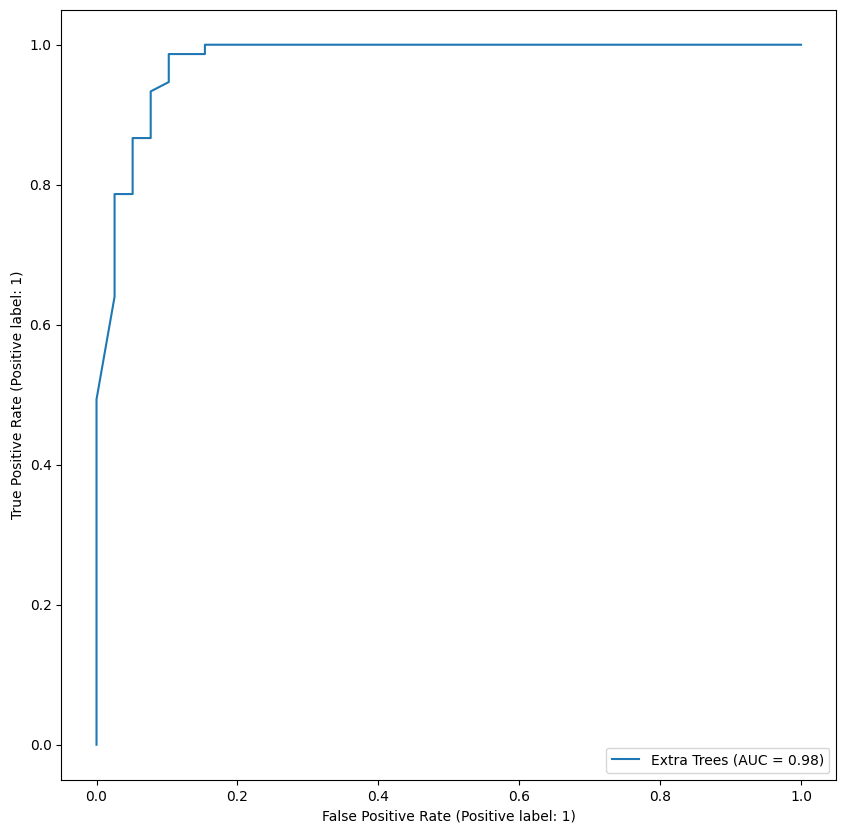

In [156]:
# Load dataset and split into training and testing sets
data = datasets.load_breast_cancer()
X, y = data.data, data.target
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.2, random_state=15)

# Initialize models
ET = ExtraTreesClassifier(random_state=15)
RFC = RandomForestClassifier(random_state=15)
svc = SVC(kernel='linear', probability=True, random_state=15)
GB = GradientBoostingClassifier(random_state=15)
ABC = AdaBoostClassifier(random_state=15)
BC = BaggingClassifier(random_state=15)
XGB = XGBClassifier(random_state=15)

# Fit models
ET.fit(X_train, y_train)
RFC.fit(X_train, y_train)
svc.fit(X_train, y_train)
GB.fit(X_train, y_train)
ABC.fit(X_train, y_train)
BC.fit(X_train, y_train)
XGB.fit(X_train, y_train)

# Plot ROC curves using RocCurveDisplay
fig, ax = plt.subplots(figsize=(10, 10))
RocCurveDisplay.from_estimator(ET, X_test, y_test, ax=ax, name='Extra Trees')


# Saving the Model

In [157]:
import pickle
filename = 'insurance.pkl'
pickle.dump(RFC, open(filename, 'wb'))

In [158]:
prediction = Insurance_model.predict(x_test)
prediction

array([1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0,
       1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1,
       1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1,
       1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1,
       0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0,
       1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1,
       1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0,
       1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0,
       1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0,

In [170]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesClassifier

# Load dataset
data = load_breast_cancer()
X, y = data.data, data.target

# Ensure that the split is correct with random_state=15
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=15)

# Train a model (using ExtraTreesClassifier as an example) with random_state=15
Insurance_model = ExtraTreesClassifier(random_state=15)
Insurance_model.fit(X_train, y_train)

# Make predictions
predictions = Insurance_model.predict(X_test)

# Ensure y_test is converted to a numpy array
a = np.array(y_test)

# Check lengths to ensure they match
print(f"Length of predictions: {len(predictions)}")
print(f"Length of y_test: {len(a)}")

# Create DataFrame
df = pd.DataFrame()
df["Predicted"] = predictions
df["Original"] = a

# Display DataFrame
print(df)


Length of predictions: 114
Length of y_test: 114
     Predicted  Original
0            1         1
1            1         1
2            0         0
3            1         1
4            1         1
..         ...       ...
109          0         0
110          1         1
111          0         0
112          0         0
113          1         1

[114 rows x 2 columns]
